<a href="https://colab.research.google.com/github/RobertFlan02/Dietetics-FYP/blob/main/Dietetics-FYP/Experiments/DeepLab/Experiment%209/DeeLabExperiment9.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Downloads

In [1]:
# Loads the kaggle.json file
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [2]:
# Install neccesary for bayesian optimization
!pip install bayesian-optimization -q


Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/cli/base_command.py", line 179, in exc_logging_wrapper
    status = run_func(*args)
             ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/cli/req_command.py", line 67, in wrapper
    return func(self, options, args)
           ^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/commands/install.py", line 447, in run
    conflicts = self._determine_conflicts(to_install)
                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/commands/install.py", line 578, in _determine_conflicts
    return check_install_conflicts(to_install)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/operations/check.py", line 101, in check_install_conflicts
    package_set, _ = create_package_set_from_installed()
              

In [3]:
# Downaloads the segmenation dataset from Kaggle
!kaggle datasets download -d eather00/eduardopachecofoodseg103

Dataset URL: https://www.kaggle.com/datasets/eather00/eduardopachecofoodseg103
License(s): apache-2.0
100% 1.16G/1.16G [00:55<00:00, 23.4MB/s]
100% 1.16G/1.16G [00:55<00:00, 22.6MB/s]


In [4]:
# Unzips the dataset
import zipfile
with zipfile.ZipFile('eduardopachecofoodseg103.zip', 'r') as zip_ref:
    zip_ref.extractall('foodseg103')

## Data visulaisation

Full training data shape: (4983, 2)
Analyzing Training Dataset for label presence and pixel counts...

Training Data Label Statistics (Excluding Class 0):
Label 1 (candy): present in 21 images, 397383 pixels
Label 2 (egg tart): present in 3 images, 213675 pixels
Label 3 (french fries): present in 166 images, 8334392 pixels
Label 4 (chocolate): present in 49 images, 1538991 pixels
Label 5 (biscuit): present in 218 images, 11714656 pixels
Label 6 (popcorn): present in 10 images, 732076 pixels
Label 7 (pudding): present in 4 images, 209320 pixels
Label 8 (ice cream): present in 636 images, 21816564 pixels
Label 9 (cheese butter): present in 276 images, 6276749 pixels
Label 10 (cake): present in 333 images, 24099184 pixels
Label 11 (wine): present in 96 images, 1479975 pixels
Label 12 (milkshake): present in 80 images, 5034866 pixels
Label 13 (coffee): present in 127 images, 1687546 pixels
Label 14 (juice): present in 129 images, 5198410 pixels
Label 15 (milk): present in 45 images, 172750

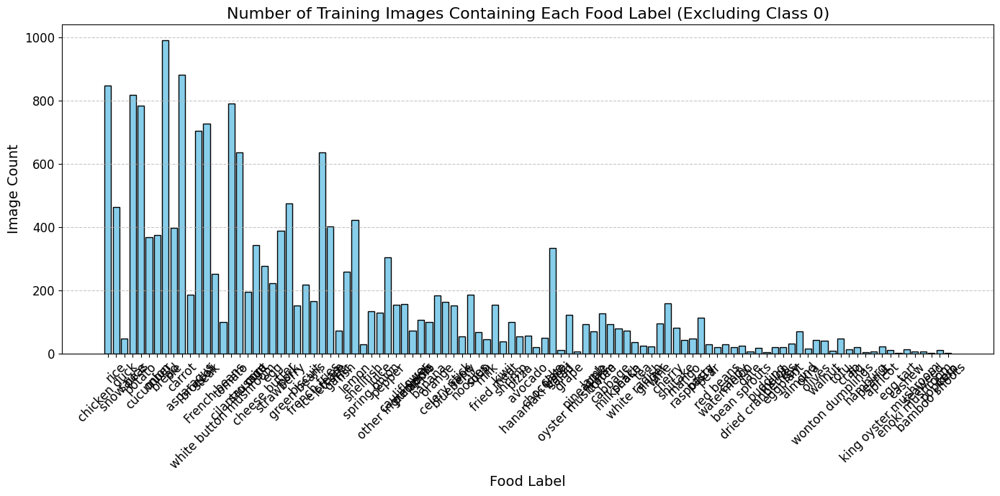


Training Dataset Outlier Images (index, unique label count):
Index: 20, Unique Labels: 8
Index: 44, Unique Labels: 8
Index: 66, Unique Labels: 8
Index: 124, Unique Labels: 8
Index: 144, Unique Labels: 8
Index: 154, Unique Labels: 10
Index: 163, Unique Labels: 8
Index: 164, Unique Labels: 8
Index: 200, Unique Labels: 10
Index: 266, Unique Labels: 8
Index: 316, Unique Labels: 8
Index: 354, Unique Labels: 8
Index: 470, Unique Labels: 8
Index: 475, Unique Labels: 8
Index: 492, Unique Labels: 9
Index: 513, Unique Labels: 10
Index: 533, Unique Labels: 8
Index: 548, Unique Labels: 8
Index: 552, Unique Labels: 8
Index: 554, Unique Labels: 10
Index: 651, Unique Labels: 8
Index: 674, Unique Labels: 8
Index: 677, Unique Labels: 11
Index: 689, Unique Labels: 8
Index: 705, Unique Labels: 8
Index: 708, Unique Labels: 8
Index: 751, Unique Labels: 9
Index: 836, Unique Labels: 8
Index: 851, Unique Labels: 8
Index: 857, Unique Labels: 9
Index: 865, Unique Labels: 9
Index: 868, Unique Labels: 11
Index: 

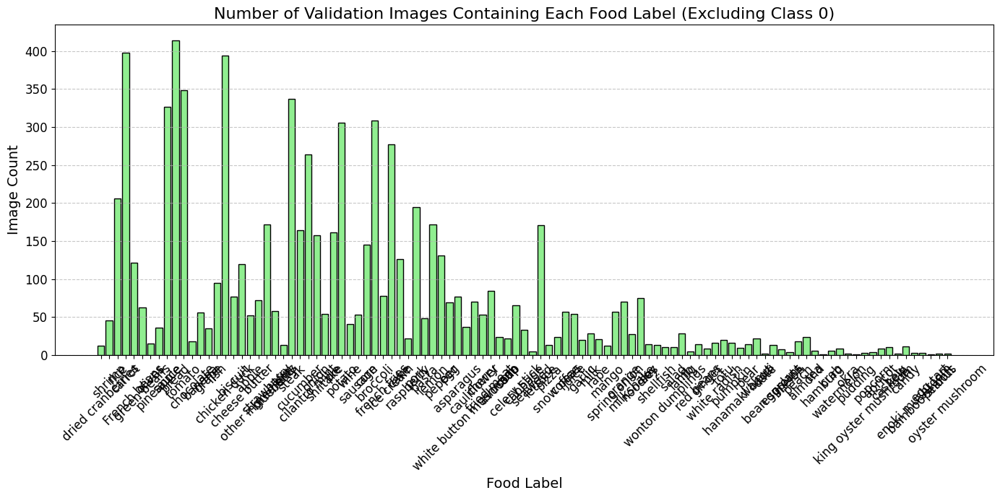


Validation Dataset Outlier Images (index, unique label count):
Index: 23, Unique Labels: 8
Index: 42, Unique Labels: 8
Index: 43, Unique Labels: 9
Index: 62, Unique Labels: 8
Index: 118, Unique Labels: 9
Index: 124, Unique Labels: 9
Index: 125, Unique Labels: 8
Index: 142, Unique Labels: 8
Index: 196, Unique Labels: 8
Index: 203, Unique Labels: 8
Index: 226, Unique Labels: 8
Index: 234, Unique Labels: 8
Index: 249, Unique Labels: 9
Index: 251, Unique Labels: 8
Index: 285, Unique Labels: 10
Index: 296, Unique Labels: 9
Index: 299, Unique Labels: 8
Index: 346, Unique Labels: 8
Index: 404, Unique Labels: 8
Index: 446, Unique Labels: 8
Index: 450, Unique Labels: 8
Index: 457, Unique Labels: 8
Index: 485, Unique Labels: 9
Index: 494, Unique Labels: 8
Index: 505, Unique Labels: 8
Index: 569, Unique Labels: 9
Index: 612, Unique Labels: 9
Index: 667, Unique Labels: 8
Index: 670, Unique Labels: 8
Index: 706, Unique Labels: 9
Index: 708, Unique Labels: 9
Index: 735, Unique Labels: 8
Index: 795,

In [ ]:
import os
import io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from pyarrow.parquet import ParquetFile

# ------------------------------
# Setup: Class mappings and transforms
# ------------------------------
# Load class mappings
class_mappings = pd.read_csv('/content/foodseg103/class_mappings.csv')
id_to_food = dict(zip(class_mappings["Class Id"], class_mappings["Class Name"]))

# Define a simple mask transform (using the validation image size as an example)
img_size = (513, 513)  # or use OPT_HYPERPARAMS["img_size"] if defined
mask_transform = transforms.Resize(img_size, interpolation=Image.NEAREST)
val_img_transform = transforms.Compose([
    transforms.Resize(img_size),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

# ------------------------------
# FoodSegDataset definition
# ------------------------------
class FoodSegDataset(Dataset):
    def __init__(self, dataframe, img_transform=None, mask_transform=None, joint_transform=None):
        self.df = dataframe
        self.img_transform = img_transform
        self.mask_transform = mask_transform
        self.joint_transform = joint_transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image_dict = row['image']
        img = Image.open(io.BytesIO(image_dict.get("bytes"))).convert("RGB")
        label_dict = row['label']
        mask = Image.open(io.BytesIO(label_dict.get("bytes")))

        # Apply joint transforms if any.
        if self.joint_transform is not None:
            img, mask = self.joint_transform(img, mask)

        if self.mask_transform:
            mask = self.mask_transform(mask)
        if self.img_transform:
            img = self.img_transform(img)

        # Convert mask to tensor (as integer labels)
        mask = torch.from_numpy(np.array(mask)).long()
        return img, mask

# ------------------------------
# Analysis on the Train Dataset
# ------------------------------
# Load the training data from the three parquet files
train_files = [
    '/content/foodseg103/train-00000-of-00003-6bb37ec387d1825a.parquet',
    '/content/foodseg103/train-00001-of-00003-4a1caa37147c0681.parquet',
    '/content/foodseg103/train-00002-of-00003-c8b698399244cd95.parquet'
]

train_dfs = [pd.read_parquet(f) for f in train_files]
full_train_df = pd.concat(train_dfs, ignore_index=True)
print("Full training data shape:", full_train_df.shape)

# Create a dataset using the FoodSegDataset (using validation transforms for consistency)
train_dataset = FoodSegDataset(full_train_df, img_transform=val_img_transform, mask_transform=mask_transform, joint_transform=None)

# Count “presence” per image (i.e. whether a label is present or not)
train_label_presence = {}  # key: label id, value: number of images containing that label
train_pixel_counts = {}    # key: label id, value: total pixel count across dataset
train_unique_label_counts = []  # count of distinct labels per image

print("Analyzing Training Dataset for label presence and pixel counts...")
for idx in range(len(train_dataset)):
    _, mask = train_dataset[idx]
    mask_np = mask.numpy()

    # Count unique labels per image (for image-level presence)
    unique_labels = np.unique(mask_np)
    for lbl in unique_labels:
        train_label_presence[lbl] = train_label_presence.get(lbl, 0) + 1

    # Count pixel frequency for each label in this image
    labels, counts = np.unique(mask_np, return_counts=True)
    for lbl, cnt in zip(labels, counts):
        train_pixel_counts[lbl] = train_pixel_counts.get(lbl, 0) + cnt

    # Record the number of unique labels in this image (for outlier detection)
    train_unique_label_counts.append(len(unique_labels))

# Print out the image presence and pixel counts for each label (excluding class 0 if desired)
print("\nTraining Data Label Statistics (Excluding Class 0):")
for lbl in sorted(train_label_presence.keys()):
    if lbl == 0:  # Optionally skip class 0 (background) if that's desired.
        continue
    print(f"Label {lbl} ({id_to_food.get(lbl, f'Class {lbl}')}): "
          f"present in {train_label_presence[lbl]} images, "
          f"{train_pixel_counts.get(lbl, 0)} pixels")

# Plotting image-level counts (presence) excluding class 0
filtered_train = [(lbl, id_to_food.get(lbl, f"Class {lbl}"), count)
                  for lbl, count in train_label_presence.items() if lbl != 0]
if filtered_train:
    labels_train_filt, food_names_train_filt, presence_counts_train_filt = zip(*filtered_train)
else:
    labels_train_filt, food_names_train_filt, presence_counts_train_filt = [], [], []

plt.figure(figsize=(14, 7))
plt.bar(food_names_train_filt, presence_counts_train_filt, color='skyblue', edgecolor='black')
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.title("Number of Training Images Containing Each Food Label (Excluding Class 0)", fontsize=16)
plt.xlabel("Food Label", fontsize=14)
plt.ylabel("Image Count", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Outlier detection in training data based on unique label counts per image
train_unique_array = np.array(train_unique_label_counts)
mean_train = train_unique_array.mean()
std_train = train_unique_array.std()
threshold_train = mean_train + 2 * std_train
outlier_train_indices = np.where(train_unique_array > threshold_train)[0]

print("\nTraining Dataset Outlier Images (index, unique label count):")
for idx in outlier_train_indices:
    print(f"Index: {idx}, Unique Labels: {train_unique_label_counts[idx]}")

# ------------------------------
# Analysis on the Validation Dataset
# ------------------------------
def stream_validation_data():
    return ParquetFile("/content/foodseg103/validation-00000-of-00001-a5bfdaa5beb7006a.parquet").iter_batches(batch_size=1)

val_label_presence = {}  # key: label id, value: number of images containing that label
val_pixel_counts = {}    # key: label id, value: total pixel count across validation data
val_unique_label_counts = []  # count of distinct labels per image

print("\nAnalyzing Validation Dataset for label presence and pixel counts...")
for i, batch in enumerate(stream_validation_data()):
    df_batch = batch.to_pandas()
    row = df_batch.iloc[0]

    label_dict = row['label']
    label_bytes = label_dict.get("bytes")
    mask = Image.open(io.BytesIO(label_bytes))
    if mask_transform:
        mask = mask_transform(mask)
    mask_np = np.array(mask)

    unique_labels = np.unique(mask_np)
    for lbl in unique_labels:
        val_label_presence[lbl] = val_label_presence.get(lbl, 0) + 1

    # Count pixel frequency for each label
    labels, counts = np.unique(mask_np, return_counts=True)
    for lbl, cnt in zip(labels, counts):
        val_pixel_counts[lbl] = val_pixel_counts.get(lbl, 0) + cnt

    val_unique_label_counts.append(len(unique_labels))

# Print out the validation label stats (excluding class 0 if desired)
print("\nValidation Data Label Statistics (Excluding Class 0):")
for lbl in sorted(val_label_presence.keys()):
    if lbl == 0:
        continue
    print(f"Label {lbl} ({id_to_food.get(lbl, f'Class {lbl}')}): "
          f"present in {val_label_presence[lbl]} images, "
          f"{val_pixel_counts.get(lbl, 0)} pixels")

# Plotting image-level counts for validation (presence) excluding class 0
filtered_val = [(lbl, id_to_food.get(lbl, f"Class {lbl}"), count)
                for lbl, count in val_label_presence.items() if lbl != 0]
if filtered_val:
    labels_val_filt, food_names_val_filt, presence_counts_val_filt = zip(*filtered_val)
else:
    labels_val_filt, food_names_val_filt, presence_counts_val_filt = [], [], []

plt.figure(figsize=(14, 7))
plt.bar(food_names_val_filt, presence_counts_val_filt, color='lightgreen', edgecolor='black')
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.title("Number of Validation Images Containing Each Food Label (Excluding Class 0)", fontsize=16)
plt.xlabel("Food Label", fontsize=14)
plt.ylabel("Image Count", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Outlier detection in validation data based on unique label counts per image
val_unique_array = np.array(val_unique_label_counts)
mean_val = val_unique_array.mean()
std_val = val_unique_array.std()
threshold_val = mean_val + 2 * std_val
outlier_val_indices = np.where(val_unique_array > threshold_val)[0]

print("\nValidation Dataset Outlier Images (index, unique label count):")
for idx in outlier_val_indices:
    print(f"Index: {idx}, Unique Labels: {val_unique_label_counts[idx]}")

# ------------------------------
# Additional Notes on Handling Imbalanced Data
# ------------------------------
print("\nAdditional Recommendations:")
print("- Consider using class weighting in your loss function based on the pixel counts per class.")
print("- Data augmentation on images containing underrepresented classes can help mitigate imbalance.")
print("- Explore advanced loss functions like focal loss or Dice loss which can help emphasize minority classes.")


## Baysian Optimiziation

In order to get better results I have reduced the number of explored hyerperparemeters to 5. I have also increased the epochs to 15 aswell as added more iterations in the hopes of fidning more optimal hyperparameters

In [ ]:
import os
import io
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import gc
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from bayes_opt import BayesianOptimization


# Set random seeds for reproducibility.
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


# Computes the pixel accuracy, mean IoU, and mean Dice from a confusion matrix.
def compute_metrics_from_confusion(conf_matrix):
    pixel_acc = np.trace(conf_matrix) / conf_matrix.sum() if conf_matrix.sum() > 0 else 0
    iou_list, dice_list = [], []
    for i in range(conf_matrix.shape[0]):
        intersection = conf_matrix[i, i]
        union = conf_matrix[i, :].sum() + conf_matrix[:, i].sum() - conf_matrix[i, i]
        if union == 0:
            iou, dice = np.nan, np.nan
        else:
            iou = intersection / union
            dice = 2.0 * intersection / (np.sum(conf_matrix[i, :]) + np.sum(conf_matrix[:, i]) + 1e-8)
        iou_list.append(iou)
        dice_list.append(dice)
    mean_iou = np.nanmean(iou_list)
    mean_dice = np.nanmean(dice_list)
    return pixel_acc, mean_iou, mean_dice

# Computes the dice loss
def dice_loss_fn(pred, target, smooth=1e-6):
    pred = torch.softmax(pred, dim=1)
    target_one_hot = torch.nn.functional.one_hot(target, num_classes=pred.shape[1])\
                           .permute(0, 3, 1, 2).float().to(pred.device)
    intersection = (pred * target_one_hot).sum(dim=(2, 3))
    union = pred.sum(dim=(2, 3)) + target_one_hot.sum(dim=(2, 3))
    dice = (2. * intersection + smooth) / (union + smooth)
    return 1 - dice.mean()

# Computes the divergence in loss between the predicted class and the target class
def vectorized_classification_loss_fn(outputs, masks, num_classes):
    p_pred = torch.softmax(outputs, dim=1).mean(dim=[2, 3])
    p_pred = p_pred[:, 1:]  # Exclude background

    # Create one-hot representation of masks
    one_hot_masks = torch.nn.functional.one_hot(masks, num_classes=num_classes)
    # Count pixel occurrences for each class
    counts = one_hot_masks.sum(dim=(1,2)).float()
    target_presence = (counts[:, 1:] > 0).float()
    # Normalize each sample's target distribution (adding epsilon to avoid divide-by-zero)
    sums = target_presence.sum(dim=1, keepdim=True)
    target_distribution = target_presence / (sums + 1e-8)
    loss_cls = nn.functional.kl_div(p_pred.log(), target_distribution, reduction='batchmean')
    return loss_cls

# Computes boundary loss
def vectorized_boundary_loss_fn(pred, target):
    pred = torch.softmax(pred, dim=1)
    N, C, H, W = pred.shape
    laplacian_kernel = torch.tensor([[0, 1, 0],
                                     [1, -4, 1],
                                     [0, 1, 0]], dtype=pred.dtype, device=pred.device).view(1, 1, 3, 3)
    laplacian_kernel = laplacian_kernel.repeat(C, 1, 1, 1)
    boundaries_pred = torch.abs(torch.nn.functional.conv2d(pred, laplacian_kernel, padding=1, groups=C))

    target_one_hot = torch.nn.functional.one_hot(target, num_classes=C).permute(0, 3, 1, 2).float().to(pred.device)
    boundaries_target = torch.abs(torch.nn.functional.conv2d(target_one_hot, laplacian_kernel, padding=1, groups=C))

    loss_boundary = torch.nn.functional.l1_loss(boundaries_pred, boundaries_target)
    return loss_boundary

# Transformer for both image and mask
class JointTransform:
    def __init__(self, flip_prob=0.5, rotation_degrees=15):
        self.flip_prob = flip_prob
        self.rotation_degrees = rotation_degrees

    def __call__(self, img, mask):
        if np.random.random() < self.flip_prob:
            img = transforms.functional.hflip(img)
            mask = transforms.functional.hflip(mask)
        if self.rotation_degrees:
            angle = np.random.uniform(-self.rotation_degrees, self.rotation_degrees)
            img = transforms.functional.rotate(img, angle, interpolation=Image.BILINEAR, expand=True)
            mask = transforms.functional.rotate(mask, angle, interpolation=Image.NEAREST, expand=True)
        return img, mask

# Dataset class
class FoodSegDataset(Dataset):
    def __init__(self, dataframe, img_transform=None, mask_resize=None, joint_transform=None):
        self.df = dataframe
        self.img_transform = img_transform
        self.mask_resize = mask_resize
        self.joint_transform = joint_transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image_dict = row['image']
        img = Image.open(io.BytesIO(image_dict.get("bytes"))).convert("RGB")
        label_dict = row['label']
        mask = Image.open(io.BytesIO(label_dict.get("bytes")))
        if self.joint_transform is not None:
            img, mask = self.joint_transform(img, mask)
        if self.mask_resize:
            mask = self.mask_resize(mask)
        if self.img_transform:
            img = self.img_transform(img)
        mask = torch.from_numpy(np.array(mask)).long()
        return img, mask


# Data Loading

class_mappings = pd.read_csv('/content/foodseg103/class_mappings.csv')
id_to_food = dict(zip(class_mappings["Class Id"], class_mappings["Class Name"]))

train_files = [
    '/content/foodseg103/train-00000-of-00003-6bb37ec387d1825a.parquet',
    '/content/foodseg103/train-00001-of-00003-4a1caa37147c0681.parquet',
    '/content/foodseg103/train-00002-of-00003-c8b698399244cd95.parquet'
]
train_dfs = [pd.read_parquet(f) for f in train_files]
full_train_df = pd.concat(train_dfs, ignore_index=True)
print("Full training data shape:", full_train_df.shape)

train_df, val_df = train_test_split(full_train_df, test_size=0.2, random_state=42)
print("Training set shape:", train_df.shape)
print("Validation set shape:", val_df.shape)
train_df_small = train_df.head(750)
val_df_small   = val_df.head(300)


# Bayesian Optimization Function

def train_evaluate(
    log_learning_rate,
    log_weight_decay,
    dice_weight,
    cls_loss_weight,
    unfreeze_frac
):
    gc.collect()
    torch.cuda.empty_cache()

    # Convert log-scale hyperparameters to their original scale.
    learning_rate = 10 ** log_learning_rate
    weight_decay  = 10 ** log_weight_decay

    # Hyperparameters
    local_hparams = {
        "img_size": (513, 513),
        "batch_size": 6,
        "num_epochs": 15,            # Maximum epochs; early stopping may trigger sooner.
        "learning_rate": learning_rate,
        "weight_decay": weight_decay,
        "dice_weight": dice_weight,
        "cls_loss_weight": cls_loss_weight,
        "boundary_loss_weight": 0.15,
        "unfreeze_frac": unfreeze_frac,  # Maximum fraction of backbone layers to unfreeze gradually.
        "dropout_rate": 0.3,
        "num_classes": 104,
        "use_amp": True
    }

    # Define transforms
    img_transform_local = transforms.Compose([
        transforms.Resize(local_hparams["img_size"]),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225]),
    ])
    mask_resize_local = transforms.Resize(local_hparams["img_size"], interpolation=Image.NEAREST)
    joint_transform_local = JointTransform(flip_prob=0.5, rotation_degrees=15)

    train_dataset_local = FoodSegDataset(train_df_small,
                                         img_transform=img_transform_local,
                                         mask_resize=mask_resize_local,
                                         joint_transform=joint_transform_local)

    train_loader_local = DataLoader(train_dataset_local,
                                    batch_size=local_hparams["batch_size"],
                                    shuffle=True, num_workers=2)

    val_dataset_local = FoodSegDataset(val_df_small,
                                       img_transform=img_transform_local,
                                       mask_resize=mask_resize_local,
                                       joint_transform=None)
    val_loader_local = DataLoader(val_dataset_local,
                                  batch_size=local_hparams["batch_size"],
                                  shuffle=False, num_workers=2)

    # Build Model
    model_local = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)
    # Freeze entire backbone initially.
    for param in model_local.backbone.parameters():
        param.requires_grad = False

    # Store backbone children for gradual unfreezing.
    backbone_children = list(model_local.backbone.children())
    n_children = len(backbone_children)
    # Compute the total number of children to eventually unfreeze.
    target_unfreeze = int(local_hparams["unfreeze_frac"] * n_children)
    current_unfrozen = 0  # Counter for how many children have been unfrozen so far.

    # Adjust classifier: insert dropout before the final layer.
    if isinstance(model_local.classifier, nn.Sequential):
        classifier_layers = list(model_local.classifier.children())
        classifier_layers.insert(-1, nn.Dropout(local_hparams["dropout_rate"]))
        classifier_layers[-1] = nn.Conv2d(256, local_hparams["num_classes"], kernel_size=1)
        model_local.classifier = nn.Sequential(*classifier_layers)
    else:
        model_local.classifier[4] = nn.Conv2d(256, local_hparams["num_classes"], kernel_size=1)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model_local = model_local.to(device)

    # Optimizer, Scheduler, AMP Scaler
    ce_criterion = nn.CrossEntropyLoss()
    optimizer_local = optim.Adam(filter(lambda p: p.requires_grad, model_local.parameters()),
                                 lr=local_hparams["learning_rate"],
                                 weight_decay=local_hparams["weight_decay"])
    scheduler_local = ReduceLROnPlateau(optimizer_local, mode='min', factor=0.5, patience=1, verbose=False)
    scaler_local = torch.cuda.amp.GradScaler() if local_hparams["use_amp"] and device.type == 'cuda' else None

    best_val_iou = 0
    patience = 3
    patience_counter = 0

    # Training and Validation Loop
    for epoch in range(local_hparams["num_epochs"]):
        model_local.train()
        epoch_loss = 0.0
        n_batches = 0

        # Gradual unfreezing
        allowed_unfreeze = int(((epoch + 1) / local_hparams["num_epochs"]) * target_unfreeze)
        if allowed_unfreeze > current_unfrozen:
            # Unfreeze additional layers.
            new_layers = backbone_children[-(allowed_unfreeze - current_unfrozen):]
            new_params = []
            for child in new_layers:
                for param in child.parameters():
                    if not param.requires_grad:
                        param.requires_grad = True
                        new_params.append(param)
            if new_params:
                optimizer_local.add_param_group({
                    'params': new_params,
                    'lr': local_hparams["learning_rate"],
                    'weight_decay': local_hparams["weight_decay"]
                })
                # Reinitialize scheduler to update its internal parameter groups.
                scheduler_local = ReduceLROnPlateau(optimizer_local, mode='min', factor=0.5, patience=1, verbose=False)
            current_unfrozen = allowed_unfreeze

        # Training loop.
        for images, masks in train_loader_local:
            images, masks = images.to(device), masks.to(device)
            optimizer_local.zero_grad()
            if scaler_local is not None:
                with torch.cuda.amp.autocast():
                    logits = model_local(images)['out']
                    loss_ce = ce_criterion(logits, masks)
                    loss_dice = dice_loss_fn(logits, masks)
                    loss_cls = vectorized_classification_loss_fn(logits, masks, local_hparams["num_classes"])
                    loss_bound = vectorized_boundary_loss_fn(logits, masks)
                    loss = (loss_ce +
                            local_hparams["dice_weight"] * loss_dice +
                            local_hparams["cls_loss_weight"] * loss_cls +
                            local_hparams["boundary_loss_weight"] * loss_bound)
                scaler_local.scale(loss).backward()
                scaler_local.step(optimizer_local)
                scaler_local.update()
            else:
                logits = model_local(images)['out']
                loss_ce = ce_criterion(logits, masks)
                loss_dice = dice_loss_fn(logits, masks)
                loss_cls = vectorized_classification_loss_fn(logits, masks, local_hparams["num_classes"])
                loss_bound = vectorized_boundary_loss_fn(logits, masks)
                loss = (loss_ce +
                        local_hparams["dice_weight"] * loss_dice +
                        local_hparams["cls_loss_weight"] * loss_cls +
                        local_hparams["boundary_loss_weight"] * loss_bound)
                loss.backward()
                optimizer_local.step()

            epoch_loss += loss.item()
            n_batches += 1

        avg_epoch_loss = epoch_loss / n_batches if n_batches > 0 else epoch_loss
        scheduler_local.step(avg_epoch_loss)

        # Validation loop after each epoch.
        model_local.eval()
        conf_matrix = np.zeros((local_hparams["num_classes"], local_hparams["num_classes"]), dtype=np.int64)
        with torch.no_grad():
            for images, masks in val_loader_local:
                images, masks = images.to(device), masks.to(device)
                logits = model_local(images)['out']
                preds = logits.argmax(dim=1).cpu().numpy()
                targets = masks.cpu().numpy()
                factor = local_hparams["num_classes"]
                batch_conf = np.bincount(
                    factor * targets.flatten() + preds.flatten(),
                    minlength=factor**2
                ).reshape(factor, factor)
                conf_matrix += batch_conf

        _, mean_iou, _ = compute_metrics_from_confusion(conf_matrix)
        print(f"Epoch {epoch+1}/{local_hparams['num_epochs']}: Avg Train Loss = {avg_epoch_loss:.4f}, Val Mean IoU = {mean_iou:.4f}")

        # Early stopping check.
        if mean_iou > best_val_iou:
            best_val_iou = mean_iou
            patience_counter = 0
        else:
            patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping triggered.")
            break

    # Cleanup to free GPU memory.
    del model_local, optimizer_local, scheduler_local, scaler_local, train_loader_local, val_loader_local
    torch.cuda.empty_cache()

    return best_val_iou  # We aim to maximize mean IoU.


# Defines search bounds for hyperparameters (now using log scale for learning rate and weight decay).
pbounds = {
    'log_learning_rate':    (-4, -2),  # corresponds to 1e-4 to 1e-2
    'log_weight_decay':     (-5, -3),  # corresponds to 1e-5 to 1e-3
    'dice_weight':          (0.0, 1.5),
    'cls_loss_weight':      (0.0, 1.0),
    'unfreeze_frac':        (0.125, 0.875),
}

optimizer_bo = BayesianOptimization(
    f=train_evaluate,
    pbounds=pbounds,
    random_state=42,
    verbose=2
)

print("Starting Bayesian Optimization...\n")
optimizer_bo.maximize(
    init_points=8,  # initial random evaluations
    n_iter=12      # guided iterations
)

print("\nBest result found:")
print(optimizer_bo.max)


Full training data shape: (4983, 2)
Training set shape: (3986, 2)
Validation set shape: (997, 2)
Starting Bayesian Optimization...

|   iter    |  target   | cls_lo... | dice_w... | log_le... | log_we... | unfree... |
-------------------------------------------------------------------------------------


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-7-c6926a7bf154>:248: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Epoch 1/15: Avg Train Loss = 4.6708, Val Mean IoU = 0.0185
Epoch 2/15: Avg Train Loss = 4.2571, Val Mean IoU = 0.0271
Epoch 3/15: Avg Train Loss = 4.1250, Val Mean IoU = 0.0386
Epoch 4/15: Avg Train Loss = 4.0298, Val Mean IoU = 0.0499
Epoch 5/15: Avg Train Loss = 3.9663, Val Mean IoU = 0.0587
Epoch 6/15: Avg Train Loss = 3.9142, Val Mean IoU = 0.0615
Epoch 7/15: Avg Train Loss = 3.8770, Val Mean IoU = 0.0602
Epoch 8/15: Avg Train Loss = 3.8126, Val Mean IoU = 0.0798
Epoch 9/15: Avg Train Loss = 3.7600, Val Mean IoU = 0.0752
Epoch 10/15: Avg Train Loss = 3.7095, Val Mean IoU = 0.0756
Epoch 11/15: Avg Train Loss = 3.6983, Val Mean IoU = 0.0802
Epoch 12/15: Avg Train Loss = 3.6533, Val Mean IoU = 0.0773
Epoch 13/15: Avg Train Loss = 3.6262, Val Mean IoU = 0.0728
Epoch 14/15: Avg Train Loss = 3.6328, Val Mean IoU = 0.0848
Epoch 15/15: Avg Train Loss = 4.0657, Val Mean IoU = 0.0683
| 1         | 0.08475   | 0.3745    | 1.426     | -2.536    | -3.803    | 0.242     |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


Epoch 1/15: Avg Train Loss = 2.5459, Val Mean IoU = 0.0138
Epoch 2/15: Avg Train Loss = 2.2629, Val Mean IoU = 0.0210
Epoch 3/15: Avg Train Loss = 2.2396, Val Mean IoU = 0.0286
Epoch 4/15: Avg Train Loss = 2.1022, Val Mean IoU = 0.0351
Epoch 5/15: Avg Train Loss = 2.0519, Val Mean IoU = 0.0331
Epoch 6/15: Avg Train Loss = 1.9856, Val Mean IoU = 0.0241
Epoch 7/15: Avg Train Loss = 1.9571, Val Mean IoU = 0.0560
Epoch 8/15: Avg Train Loss = 1.8986, Val Mean IoU = 0.0560
Epoch 9/15: Avg Train Loss = 1.8746, Val Mean IoU = 0.0606
Epoch 10/15: Avg Train Loss = 1.8314, Val Mean IoU = 0.0493
Epoch 11/15: Avg Train Loss = 1.7953, Val Mean IoU = 0.0634
Epoch 12/15: Avg Train Loss = 1.7769, Val Mean IoU = 0.0795
Epoch 13/15: Avg Train Loss = 1.7451, Val Mean IoU = 0.0706
Epoch 14/15: Avg Train Loss = 1.7346, Val Mean IoU = 0.0809
Epoch 15/15: Avg Train Loss = 1.6847, Val Mean IoU = 0.0809
| 2         | 0.08094   | 0.156     | 0.08713   | -2.268    | -3.798    | 0.6561    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


Epoch 1/15: Avg Train Loss = 3.4177, Val Mean IoU = 0.0165
Epoch 2/15: Avg Train Loss = 3.0721, Val Mean IoU = 0.0248
Epoch 3/15: Avg Train Loss = 2.9837, Val Mean IoU = 0.0365
Epoch 4/15: Avg Train Loss = 2.9239, Val Mean IoU = 0.0428
Epoch 5/15: Avg Train Loss = 2.8650, Val Mean IoU = 0.0539
Epoch 6/15: Avg Train Loss = 2.8237, Val Mean IoU = 0.0604
Epoch 7/15: Avg Train Loss = 2.7595, Val Mean IoU = 0.0687
Epoch 8/15: Avg Train Loss = 2.9958, Val Mean IoU = 0.0617
Epoch 9/15: Avg Train Loss = 2.7856, Val Mean IoU = 0.0650
Epoch 10/15: Avg Train Loss = 2.7057, Val Mean IoU = 0.0686
Early stopping triggered.
| 3         | 0.06874   | 0.02058   | 1.455     | -2.335    | -4.575    | 0.2614    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


Epoch 1/15: Avg Train Loss = 3.1135, Val Mean IoU = 0.0209
Epoch 2/15: Avg Train Loss = 2.6196, Val Mean IoU = 0.0350
Epoch 3/15: Avg Train Loss = 2.4569, Val Mean IoU = 0.0458
Epoch 4/15: Avg Train Loss = 2.3394, Val Mean IoU = 0.0608
Epoch 5/15: Avg Train Loss = 2.2484, Val Mean IoU = 0.0713
Epoch 6/15: Avg Train Loss = 2.2084, Val Mean IoU = 0.0808
Epoch 7/15: Avg Train Loss = 2.1210, Val Mean IoU = 0.0869
Epoch 8/15: Avg Train Loss = 2.3940, Val Mean IoU = 0.0825
Epoch 9/15: Avg Train Loss = 2.1205, Val Mean IoU = 0.0932
Epoch 10/15: Avg Train Loss = 2.0070, Val Mean IoU = 0.0948
Epoch 11/15: Avg Train Loss = 1.9499, Val Mean IoU = 0.0972
Epoch 12/15: Avg Train Loss = 1.8593, Val Mean IoU = 0.0976
Epoch 13/15: Avg Train Loss = 1.8329, Val Mean IoU = 0.1084
Epoch 14/15: Avg Train Loss = 1.7511, Val Mean IoU = 0.1136
Epoch 15/15: Avg Train Loss = 1.7010, Val Mean IoU = 0.1189
| 4         | 0.1189    | 0.1834    | 0.4564    | -2.95     | -4.136    | 0.3434    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


Epoch 1/15: Avg Train Loss = 4.7368, Val Mean IoU = 0.0201
Epoch 2/15: Avg Train Loss = 3.8331, Val Mean IoU = 0.0315
Epoch 3/15: Avg Train Loss = 3.5834, Val Mean IoU = 0.0407
Epoch 4/15: Avg Train Loss = 3.3950, Val Mean IoU = 0.0548
Epoch 5/15: Avg Train Loss = 3.4108, Val Mean IoU = 0.0780
Epoch 6/15: Avg Train Loss = 3.1181, Val Mean IoU = 0.0898
Epoch 7/15: Avg Train Loss = 2.9401, Val Mean IoU = 0.0906
Epoch 8/15: Avg Train Loss = 2.7628, Val Mean IoU = 0.0999
Epoch 9/15: Avg Train Loss = 2.6088, Val Mean IoU = 0.1081
Epoch 10/15: Avg Train Loss = 2.4879, Val Mean IoU = 0.1184
Epoch 11/15: Avg Train Loss = 2.3149, Val Mean IoU = 0.1291
Epoch 12/15: Avg Train Loss = 2.2331, Val Mean IoU = 0.1194
Epoch 13/15: Avg Train Loss = 2.0960, Val Mean IoU = 0.1354
Epoch 14/15: Avg Train Loss = 1.9815, Val Mean IoU = 0.1388
Epoch 15/15: Avg Train Loss = 1.8688, Val Mean IoU = 0.1327
| 5         | 0.1388    | 0.6119    | 0.2092    | -3.416    | -4.267    | 0.4671    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


Epoch 1/15: Avg Train Loss = 4.9904, Val Mean IoU = 0.0186
Epoch 2/15: Avg Train Loss = 4.4186, Val Mean IoU = 0.0331
Epoch 3/15: Avg Train Loss = 4.1672, Val Mean IoU = 0.0463
Epoch 4/15: Avg Train Loss = 3.9959, Val Mean IoU = 0.0621
Epoch 5/15: Avg Train Loss = 3.8534, Val Mean IoU = 0.0663
Epoch 6/15: Avg Train Loss = 3.6870, Val Mean IoU = 0.0683
Epoch 7/15: Avg Train Loss = 3.6279, Val Mean IoU = 0.0811
Epoch 8/15: Avg Train Loss = 3.5116, Val Mean IoU = 0.0815
Epoch 9/15: Avg Train Loss = 3.4041, Val Mean IoU = 0.0942
Epoch 10/15: Avg Train Loss = 3.3174, Val Mean IoU = 0.0955
Epoch 11/15: Avg Train Loss = 3.2597, Val Mean IoU = 0.0875
Epoch 12/15: Avg Train Loss = 3.1265, Val Mean IoU = 0.0916
Epoch 13/15: Avg Train Loss = 3.0953, Val Mean IoU = 0.0894
Early stopping triggered.
| 6         | 0.0955    | 0.7852    | 0.2995    | -2.972    | -3.815    | 0.1598    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


Epoch 1/15: Avg Train Loss = 5.4711, Val Mean IoU = 0.0181
Epoch 2/15: Avg Train Loss = 4.3673, Val Mean IoU = 0.0231
Epoch 3/15: Avg Train Loss = 3.9396, Val Mean IoU = 0.0365
Epoch 4/15: Avg Train Loss = 3.6170, Val Mean IoU = 0.0523
Epoch 5/15: Avg Train Loss = 3.3805, Val Mean IoU = 0.0662
Epoch 6/15: Avg Train Loss = 3.2476, Val Mean IoU = 0.0777
Epoch 7/15: Avg Train Loss = 3.0459, Val Mean IoU = 0.0836
Epoch 8/15: Avg Train Loss = 2.9040, Val Mean IoU = 0.0932
Epoch 9/15: Avg Train Loss = 2.7882, Val Mean IoU = 0.0984
Epoch 10/15: Avg Train Loss = 2.6358, Val Mean IoU = 0.1141
Epoch 11/15: Avg Train Loss = 2.5231, Val Mean IoU = 0.1283
Epoch 12/15: Avg Train Loss = 2.4103, Val Mean IoU = 0.1277
Epoch 13/15: Avg Train Loss = 2.3246, Val Mean IoU = 0.1274
Epoch 14/15: Avg Train Loss = 2.1924, Val Mean IoU = 0.1361
Epoch 15/15: Avg Train Loss = 2.1028, Val Mean IoU = 0.1384
| 7         | 0.1384    | 0.6075    | 0.2558    | -3.87     | -3.102    | 0.8492    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


Epoch 1/15: Avg Train Loss = 6.2170, Val Mean IoU = 0.0192
Epoch 2/15: Avg Train Loss = 5.0446, Val Mean IoU = 0.0278
Epoch 3/15: Avg Train Loss = 4.6684, Val Mean IoU = 0.0331
Epoch 4/15: Avg Train Loss = 4.4601, Val Mean IoU = 0.0399
Epoch 5/15: Avg Train Loss = 4.3549, Val Mean IoU = 0.0551
Epoch 6/15: Avg Train Loss = 4.0531, Val Mean IoU = 0.0680
Epoch 7/15: Avg Train Loss = 3.8474, Val Mean IoU = 0.0834
Epoch 8/15: Avg Train Loss = 3.6439, Val Mean IoU = 0.0946
Epoch 9/15: Avg Train Loss = 3.4648, Val Mean IoU = 0.1078
Epoch 10/15: Avg Train Loss = 3.2718, Val Mean IoU = 0.1130
Epoch 11/15: Avg Train Loss = 3.1489, Val Mean IoU = 0.1265
Epoch 12/15: Avg Train Loss = 3.0018, Val Mean IoU = 0.1263
Epoch 13/15: Avg Train Loss = 2.8642, Val Mean IoU = 0.1388
Epoch 14/15: Avg Train Loss = 2.7234, Val Mean IoU = 0.1318
Epoch 15/15: Avg Train Loss = 2.6128, Val Mean IoU = 0.1359
| 8         | 0.1388    | 0.8084    | 0.4569    | -3.805    | -3.632    | 0.4551    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-7-c6926a7bf154>:248: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Epoch 1/15: Avg Train Loss = 3.6418, Val Mean IoU = 0.0143
Epoch 2/15: Avg Train Loss = 2.6029, Val Mean IoU = 0.0199
Epoch 3/15: Avg Train Loss = 2.1486, Val Mean IoU = 0.0296
Epoch 4/15: Avg Train Loss = 1.8596, Val Mean IoU = 0.0434
Epoch 5/15: Avg Train Loss = 1.7210, Val Mean IoU = 0.0526
Epoch 6/15: Avg Train Loss = 1.5864, Val Mean IoU = 0.0596
Epoch 7/15: Avg Train Loss = 1.4765, Val Mean IoU = 0.0718
Epoch 8/15: Avg Train Loss = 1.3658, Val Mean IoU = 0.0763
Epoch 9/15: Avg Train Loss = 1.2772, Val Mean IoU = 0.0837
Epoch 10/15: Avg Train Loss = 1.1974, Val Mean IoU = 0.0999
Epoch 11/15: Avg Train Loss = 1.1260, Val Mean IoU = 0.1034
Epoch 12/15: Avg Train Loss = 1.0658, Val Mean IoU = 0.1173
Epoch 13/15: Avg Train Loss = 0.9831, Val Mean IoU = 0.1191
Epoch 14/15: Avg Train Loss = 0.9211, Val Mean IoU = 0.1260
Epoch 15/15: Avg Train Loss = 0.8927, Val Mean IoU = 0.1368
| 9         | 0.1368    | 0.0       | 0.2998    | -4.0      | -4.164    | 0.875     |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-7-c6926a7bf154>:248: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Epoch 1/15: Avg Train Loss = 5.4822, Val Mean IoU = 0.0152
Epoch 2/15: Avg Train Loss = 4.4238, Val Mean IoU = 0.0204
Epoch 3/15: Avg Train Loss = 4.0162, Val Mean IoU = 0.0247
Epoch 4/15: Avg Train Loss = 3.7820, Val Mean IoU = 0.0337
Epoch 5/15: Avg Train Loss = 3.6077, Val Mean IoU = 0.0417
Epoch 6/15: Avg Train Loss = 3.4512, Val Mean IoU = 0.0424
Epoch 7/15: Avg Train Loss = 3.3394, Val Mean IoU = 0.0503
Epoch 8/15: Avg Train Loss = 3.2325, Val Mean IoU = 0.0526
Epoch 9/15: Avg Train Loss = 3.1098, Val Mean IoU = 0.0609
Epoch 10/15: Avg Train Loss = 3.0101, Val Mean IoU = 0.0689
Epoch 11/15: Avg Train Loss = 2.9133, Val Mean IoU = 0.0719
Epoch 12/15: Avg Train Loss = 2.8143, Val Mean IoU = 0.0809
Epoch 13/15: Avg Train Loss = 2.7168, Val Mean IoU = 0.0877
Epoch 14/15: Avg Train Loss = 2.6285, Val Mean IoU = 0.0929
Epoch 15/15: Avg Train Loss = 2.7606, Val Mean IoU = 0.1023
| 10        | 0.1023    | 0.6235    | 0.1588    | -3.969    | -4.968    | 0.1634    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-7-c6926a7bf154>:248: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Epoch 1/15: Avg Train Loss = 4.5602, Val Mean IoU = 0.0163
Epoch 2/15: Avg Train Loss = 3.4923, Val Mean IoU = 0.0205
Epoch 3/15: Avg Train Loss = 3.0805, Val Mean IoU = 0.0334
Epoch 4/15: Avg Train Loss = 2.8209, Val Mean IoU = 0.0397
Epoch 5/15: Avg Train Loss = 2.6520, Val Mean IoU = 0.0511
Epoch 6/15: Avg Train Loss = 2.5134, Val Mean IoU = 0.0581
Epoch 7/15: Avg Train Loss = 2.3926, Val Mean IoU = 0.0648
Epoch 8/15: Avg Train Loss = 2.2833, Val Mean IoU = 0.0759
Epoch 9/15: Avg Train Loss = 2.2023, Val Mean IoU = 0.0898
Epoch 10/15: Avg Train Loss = 2.1202, Val Mean IoU = 0.0980
Epoch 11/15: Avg Train Loss = 2.0504, Val Mean IoU = 0.1080
Epoch 12/15: Avg Train Loss = 1.9866, Val Mean IoU = 0.1089
Epoch 13/15: Avg Train Loss = 1.9138, Val Mean IoU = 0.1140
Epoch 14/15: Avg Train Loss = 1.8645, Val Mean IoU = 0.1212
Epoch 15/15: Avg Train Loss = 1.8190, Val Mean IoU = 0.1249
| 11        | 0.1249    | 0.06188   | 1.064     | -3.979    | -3.282    | 0.8636    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-7-c6926a7bf154>:248: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Epoch 1/15: Avg Train Loss = 3.5463, Val Mean IoU = 0.0154
Epoch 2/15: Avg Train Loss = 2.5054, Val Mean IoU = 0.0207
Epoch 3/15: Avg Train Loss = 2.1488, Val Mean IoU = 0.0245
Epoch 4/15: Avg Train Loss = 1.9367, Val Mean IoU = 0.0291
Epoch 5/15: Avg Train Loss = 1.8102, Val Mean IoU = 0.0371
Epoch 6/15: Avg Train Loss = 1.7172, Val Mean IoU = 0.0412
Epoch 7/15: Avg Train Loss = 1.6210, Val Mean IoU = 0.0447
Epoch 8/15: Avg Train Loss = 1.5683, Val Mean IoU = 0.0503
Epoch 9/15: Avg Train Loss = 1.5190, Val Mean IoU = 0.0521
Epoch 10/15: Avg Train Loss = 1.4570, Val Mean IoU = 0.0574
Epoch 11/15: Avg Train Loss = 1.4064, Val Mean IoU = 0.0612
Epoch 12/15: Avg Train Loss = 1.3494, Val Mean IoU = 0.0657
Epoch 13/15: Avg Train Loss = 1.3070, Val Mean IoU = 0.0807
Epoch 14/15: Avg Train Loss = 1.2671, Val Mean IoU = 0.0791
Epoch 15/15: Avg Train Loss = 1.3275, Val Mean IoU = 0.0984
| 12        | 0.09845   | 0.0723    | 0.08395   | -3.947    | -3.235    | 0.1787    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-7-c6926a7bf154>:248: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Epoch 1/15: Avg Train Loss = 6.0826, Val Mean IoU = 0.0184
Epoch 2/15: Avg Train Loss = 4.9463, Val Mean IoU = 0.0233
Epoch 3/15: Avg Train Loss = 4.5851, Val Mean IoU = 0.0401
Epoch 4/15: Avg Train Loss = 4.2738, Val Mean IoU = 0.0523
Epoch 5/15: Avg Train Loss = 4.0413, Val Mean IoU = 0.0586
Epoch 6/15: Avg Train Loss = 3.8465, Val Mean IoU = 0.0850
Epoch 7/15: Avg Train Loss = 3.6426, Val Mean IoU = 0.0907
Epoch 8/15: Avg Train Loss = 3.4826, Val Mean IoU = 0.1049
Epoch 9/15: Avg Train Loss = 3.3281, Val Mean IoU = 0.1164
Epoch 10/15: Avg Train Loss = 3.1773, Val Mean IoU = 0.1119
Epoch 11/15: Avg Train Loss = 3.0243, Val Mean IoU = 0.1325
Epoch 12/15: Avg Train Loss = 2.8953, Val Mean IoU = 0.1339
Epoch 13/15: Avg Train Loss = 2.7557, Val Mean IoU = 0.1475
Epoch 14/15: Avg Train Loss = 2.6529, Val Mean IoU = 0.1359
Epoch 15/15: Avg Train Loss = 2.5574, Val Mean IoU = 0.1446
| 13        | 0.1475    | 0.7211    | 0.6602    | -3.795    | -4.225    | 0.8401    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-7-c6926a7bf154>:248: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Epoch 1/15: Avg Train Loss = 8.1378, Val Mean IoU = 0.0186
Epoch 2/15: Avg Train Loss = 6.9321, Val Mean IoU = 0.0233
Epoch 3/15: Avg Train Loss = 6.4269, Val Mean IoU = 0.0382
Epoch 4/15: Avg Train Loss = 6.0193, Val Mean IoU = 0.0510
Epoch 5/15: Avg Train Loss = 5.7465, Val Mean IoU = 0.0564
Epoch 6/15: Avg Train Loss = 5.4917, Val Mean IoU = 0.0688
Epoch 7/15: Avg Train Loss = 5.2728, Val Mean IoU = 0.0729
Epoch 8/15: Avg Train Loss = 5.0628, Val Mean IoU = 0.0866
Epoch 9/15: Avg Train Loss = 4.8947, Val Mean IoU = 0.0973
Epoch 10/15: Avg Train Loss = 4.7308, Val Mean IoU = 0.1104
Epoch 11/15: Avg Train Loss = 4.5553, Val Mean IoU = 0.1162
Epoch 12/15: Avg Train Loss = 4.4075, Val Mean IoU = 0.1257
Epoch 13/15: Avg Train Loss = 4.2301, Val Mean IoU = 0.1314
Epoch 14/15: Avg Train Loss = 4.0786, Val Mean IoU = 0.1323
Epoch 15/15: Avg Train Loss = 3.9843, Val Mean IoU = 0.1289
| 14        | 0.1323    | 0.9989    | 1.482     | -3.953    | -3.548    | 0.7443    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-7-c6926a7bf154>:248: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Epoch 1/15: Avg Train Loss = 6.1797, Val Mean IoU = 0.0150
Epoch 2/15: Avg Train Loss = 5.0367, Val Mean IoU = 0.0241
Epoch 3/15: Avg Train Loss = 4.6390, Val Mean IoU = 0.0359
Epoch 4/15: Avg Train Loss = 4.2813, Val Mean IoU = 0.0513
Epoch 5/15: Avg Train Loss = 4.0539, Val Mean IoU = 0.0546
Epoch 6/15: Avg Train Loss = 3.8431, Val Mean IoU = 0.0751
Epoch 7/15: Avg Train Loss = 3.6361, Val Mean IoU = 0.0811
Epoch 8/15: Avg Train Loss = 3.4596, Val Mean IoU = 0.0981
Epoch 9/15: Avg Train Loss = 3.2527, Val Mean IoU = 0.0982
Epoch 10/15: Avg Train Loss = 3.0678, Val Mean IoU = 0.1178
Epoch 11/15: Avg Train Loss = 2.9445, Val Mean IoU = 0.1202
Epoch 12/15: Avg Train Loss = 2.8189, Val Mean IoU = 0.1303
Epoch 13/15: Avg Train Loss = 2.6177, Val Mean IoU = 0.1286
Epoch 14/15: Avg Train Loss = 2.5366, Val Mean IoU = 0.1333
Epoch 15/15: Avg Train Loss = 2.4094, Val Mean IoU = 0.1436
| 15        | 0.1436    | 0.9126    | 0.07083   | -3.824    | -3.805    | 0.8612    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-7-c6926a7bf154>:248: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Epoch 1/15: Avg Train Loss = 7.3659, Val Mean IoU = 0.0165
Epoch 2/15: Avg Train Loss = 6.2398, Val Mean IoU = 0.0247
Epoch 3/15: Avg Train Loss = 5.8722, Val Mean IoU = 0.0454
Epoch 4/15: Avg Train Loss = 5.5184, Val Mean IoU = 0.0540
Epoch 5/15: Avg Train Loss = 5.2641, Val Mean IoU = 0.0629
Epoch 6/15: Avg Train Loss = 5.0359, Val Mean IoU = 0.0709
Epoch 7/15: Avg Train Loss = 4.8374, Val Mean IoU = 0.0877
Epoch 8/15: Avg Train Loss = 4.6539, Val Mean IoU = 0.0962
Epoch 9/15: Avg Train Loss = 4.4838, Val Mean IoU = 0.1098
Epoch 10/15: Avg Train Loss = 4.3202, Val Mean IoU = 0.1219
Epoch 11/15: Avg Train Loss = 4.1612, Val Mean IoU = 0.1201
Epoch 12/15: Avg Train Loss = 3.9702, Val Mean IoU = 0.1298
Epoch 13/15: Avg Train Loss = 3.9005, Val Mean IoU = 0.1331
Epoch 14/15: Avg Train Loss = 3.7373, Val Mean IoU = 0.1362
Epoch 15/15: Avg Train Loss = 3.6235, Val Mean IoU = 0.1400
| 16        | 0.14      | 0.8709    | 1.478     | -3.818    | -4.972    | 0.8745    |


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-7-c6926a7bf154>:248: FutureWarning: `torch.cuda.amp.GradScaler(args...)`

Epoch 1/15: Avg Train Loss = 5.1698, Val Mean IoU = 0.0179
Epoch 2/15: Avg Train Loss = 4.1674, Val Mean IoU = 0.0208
Epoch 3/15: Avg Train Loss = 3.7226, Val Mean IoU = 0.0303
Epoch 4/15: Avg Train Loss = 3.4605, Val Mean IoU = 0.0473
Epoch 5/15: Avg Train Loss = 3.2681, Val Mean IoU = 0.0630
Epoch 6/15: Avg Train Loss = 3.1250, Val Mean IoU = 0.0682
Epoch 7/15: Avg Train Loss = 3.0034, Val Mean IoU = 0.0793
Epoch 8/15: Avg Train Loss = 2.8687, Val Mean IoU = 0.0897
Epoch 9/15: Avg Train Loss = 2.7467, Val Mean IoU = 0.0998
Epoch 10/15: Avg Train Loss = 2.6533, Val Mean IoU = 0.1066
Epoch 11/15: Avg Train Loss = 2.5523, Val Mean IoU = 0.1272
Epoch 12/15: Avg Train Loss = 2.4607, Val Mean IoU = 0.1295
Epoch 13/15: Avg Train Loss = 2.3849, Val Mean IoU = 0.1316
Epoch 14/15: Avg Train Loss = 2.3225, Val Mean IoU = 0.1354


In [ ]:
import gc

gc.collect()
torch.cuda.empty_cache()


## Training Code

Big changes include switching from cross entropy loss to focal loss aswell as deactivating both boundary loss and classification loss, switch to PolyLR Scheduler

In [9]:
import os
import io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split

# ------------------------------
# Hyperparameters
# ------------------------------
OPT_HYPERPARAMS = {
    "img_size": (512, 512),
    "batch_size": 6,
    "num_epochs": 30,
    "learning_rate": 1e-4,
    "weight_decay": 1e-5,
    "num_workers": 4,
    "num_classes": 104,
    "use_amp": True,
    "flip_prob": 0.5,
    "rotation_degrees": 10,
    "dice_weight": 0.7,
    "dropout_rate": 0.5,
    "color_jitter_brightness": 0.2,
    "color_jitter_contrast": 0.2,
    "color_jitter_saturation": 0.2,
    "color_jitter_hue": 0.1,
    "focal_gamma": 1.5
}

# ------------------------------
# Custom PolyLR Scheduler
# ------------------------------
class PolyLR:
    """
    Polynomial LR decay:
        lr = base_lr * (1 - epoch/max_epochs)^power
    """
    def __init__(self, optimizer, base_lr, max_epochs, power=0.9):
        self.optimizer = optimizer
        self.base_lr = base_lr
        self.max_epochs = max_epochs
        self.power = power
        self.epoch = 0

    def step(self):
        lr = self.base_lr * (1 - float(self.epoch) / self.max_epochs) ** self.power
        for param_group in self.optimizer.param_groups:
            param_group['lr'] = lr
        self.epoch += 1

# ------------------------------
# Metrics & Loss Functions
# ------------------------------
def compute_metrics_from_confusion(conf_matrix):
    """
    Computes pixel accuracy, mean IoU, and mean Dice from a confusion matrix.
    """
    pixel_acc = np.trace(conf_matrix) / conf_matrix.sum() if conf_matrix.sum() > 0 else 0
    iou_list = []
    dice_list = []
    for i in range(conf_matrix.shape[0]):
        intersection = conf_matrix[i, i]
        union = conf_matrix[i, :].sum() + conf_matrix[:, i].sum() - intersection
        if union == 0:
            iou, dice = np.nan, np.nan
        else:
            iou = intersection / union
            s = np.sum(conf_matrix[i, :]) + np.sum(conf_matrix[:, i])
            dice = np.nan if s == 0 else (2. * intersection) / (s + 1e-8)
        iou_list.append(iou)
        dice_list.append(dice)
    mean_iou = np.nanmean(iou_list)
    mean_dice = np.nanmean(dice_list)
    return pixel_acc, mean_iou, mean_dice

def compute_food_accuracy(preds, targets):
    """
    Returns % of non-background (class != 0) pixels predicted correctly.
    """
    correct = 0
    total = 0
    for i in range(len(preds)):
        non_bg = (targets[i] != 0)
        correct += (preds[i][non_bg] == targets[i][non_bg]).sum()
        total += non_bg.sum()
    return 100.0 * correct / (total + 1e-8)

def focal_loss_fn(outputs, targets, alpha=None, gamma=1.5):
    log_probs = torch.log_softmax(outputs, dim=1)
    probs = torch.softmax(outputs, dim=1)

    N, C, H, W = outputs.shape
    log_probs_flat = log_probs.permute(0, 2, 3, 1).reshape(-1, C)
    probs_flat = probs.permute(0, 2, 3, 1).reshape(-1, C)
    targets_flat = targets.view(-1)

    log_probs_true = log_probs_flat[range(log_probs_flat.shape[0]), targets_flat]
    probs_true = probs_flat[range(probs_flat.shape[0]), targets_flat]

    if alpha is not None:
        alpha_factor = alpha[targets_flat]
    else:
        alpha_factor = 1.0

    focal_factor = (1.0 - probs_true) ** gamma
    loss = -alpha_factor * focal_factor * log_probs_true
    return loss.mean()

def dice_loss_fn(pred, target, smooth=1e-6):
    pred = torch.softmax(pred, dim=1)
    target_one_hot = nn.functional.one_hot(target, num_classes=pred.shape[1]) \
                           .permute(0, 3, 1, 2).float().to(pred.device)
    intersection = (pred * target_one_hot).sum(dim=(2, 3))
    union = pred.sum(dim=(2, 3)) + target_one_hot.sum(dim=(2, 3))
    dice = (2. * intersection + smooth) / (union + smooth)
    return 1 - dice.mean()

# ------------------------------
# Dataset & Transforms
# ------------------------------
class FoodSegDataset(Dataset):
    def __init__(self, dataframe, img_transform=None, mask_transform=None, joint_transform=None):
        self.df = dataframe
        self.img_transform = img_transform
        self.mask_transform = mask_transform
        self.joint_transform = joint_transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image_dict = row['image']
        img = Image.open(io.BytesIO(image_dict.get("bytes"))).convert("RGB")
        label_dict = row['label']
        mask = Image.open(io.BytesIO(label_dict.get("bytes")))

        if self.joint_transform is not None:
            img, mask = self.joint_transform(img, mask)

        if self.mask_transform:
            mask = self.mask_transform(mask)
        if self.img_transform:
            img = self.img_transform(img)

        mask = torch.from_numpy(np.array(mask)).long()
        return img, mask

class JointTransform:
    def __init__(self, flip_prob=0.5, rotation_degrees=10, random_crop=True, crop_scale=(0.8, 1.2), crop_size=(512,512)):
        self.flip_prob = flip_prob
        self.rotation_degrees = rotation_degrees
        self.random_crop = random_crop
        self.crop_scale = crop_scale
        self.crop_size = crop_size

    def __call__(self, img, mask):
        if self.random_crop and self.crop_size is not None:
            i, j, h, w = transforms.RandomResizedCrop.get_params(img, scale=self.crop_scale, ratio=(3/4, 4/3))
            img = transforms.functional.resized_crop(img, i, j, h, w, self.crop_size, interpolation=Image.BILINEAR)
            mask = transforms.functional.resized_crop(mask, i, j, h, w, self.crop_size, interpolation=Image.NEAREST)

        if np.random.random() < self.flip_prob:
            img = transforms.functional.hflip(img)
            mask = transforms.functional.hflip(mask)

        if self.rotation_degrees:
            angle = np.random.uniform(-self.rotation_degrees, self.rotation_degrees)
            img = transforms.functional.rotate(img, angle, interpolation=Image.BILINEAR)
            mask = transforms.functional.rotate(mask, angle, interpolation=Image.NEAREST)
        return img, mask

# ------------------------------
# Example: Loading Data
# (Adjust paths as needed)
# ------------------------------
train_files = [
    '/content/foodseg103/train-00000-of-00003-6bb37ec387d1825a.parquet',
    '/content/foodseg103/train-00001-of-00003-4a1caa37147c0681.parquet',
    '/content/foodseg103/train-00002-of-00003-c8b698399244cd95.parquet'
]
train_dfs = [pd.read_parquet(f) for f in train_files]
full_train_df = pd.concat(train_dfs, ignore_index=True)

train_df, test_df = train_test_split(full_train_df, test_size=0.2, random_state=42)

class_mappings = pd.read_csv('/content/foodseg103/class_mappings.csv')
id_to_food = dict(zip(class_mappings["Class Id"], class_mappings["Class Name"]))

# ------------------------------
# Build Dataset & DataLoader
# ------------------------------
train_joint_transform = JointTransform(
    flip_prob=OPT_HYPERPARAMS["flip_prob"],
    rotation_degrees=OPT_HYPERPARAMS["rotation_degrees"],
    random_crop=True,
    crop_scale=(0.8, 1.2),
    crop_size=OPT_HYPERPARAMS["img_size"]
)

train_img_transform = transforms.Compose([
    transforms.ColorJitter(
        brightness=OPT_HYPERPARAMS["color_jitter_brightness"],
        contrast=OPT_HYPERPARAMS["color_jitter_contrast"],
        saturation=OPT_HYPERPARAMS["color_jitter_saturation"],
        hue=OPT_HYPERPARAMS["color_jitter_hue"]
    ),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

val_img_transform = transforms.Compose([
    transforms.Resize(OPT_HYPERPARAMS["img_size"]),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

mask_transform = transforms.Resize(OPT_HYPERPARAMS["img_size"], interpolation=Image.NEAREST)

train_dataset = FoodSegDataset(train_df,
                               img_transform=train_img_transform,
                               mask_transform=mask_transform,
                               joint_transform=train_joint_transform)

test_dataset = FoodSegDataset(test_df,
                              img_transform=val_img_transform,
                              mask_transform=mask_transform,
                              joint_transform=None)

train_loader = DataLoader(train_dataset, batch_size=OPT_HYPERPARAMS["batch_size"],
                          shuffle=True, num_workers=OPT_HYPERPARAMS["num_workers"])
test_loader = DataLoader(test_dataset, batch_size=OPT_HYPERPARAMS["batch_size"],
                         shuffle=False, num_workers=OPT_HYPERPARAMS["num_workers"])

# ------------------------------
# Build Model
# ------------------------------
model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)

# Unfreeze entire backbone
for param in model.backbone.parameters():
    param.requires_grad = True

# Insert dropout & adjust final classifier
if isinstance(model.classifier, nn.Sequential):
    classifier_layers = list(model.classifier.children())
    # Insert dropout before the final conv
    classifier_layers.insert(-1, nn.Dropout(OPT_HYPERPARAMS["dropout_rate"]))
    # Update final conv to have num_classes filters
    classifier_layers[-1] = nn.Conv2d(256, OPT_HYPERPARAMS["num_classes"], kernel_size=1)
    model.classifier = nn.Sequential(*classifier_layers)
else:
    model.classifier[4] = nn.Conv2d(256, OPT_HYPERPARAMS["num_classes"], kernel_size=1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# ------------------------------
# Compute Class Weights (Clipped)
# ------------------------------
all_pixel_counts = np.zeros(OPT_HYPERPARAMS["num_classes"], dtype=np.float64)
for img, mask in tqdm(FoodSegDataset(train_df), desc="Counting pixels"):
    mask_np = mask.numpy()
    unique_labels, counts = np.unique(mask_np, return_counts=True)
    for lbl, cnt in zip(unique_labels, counts):
        if lbl < OPT_HYPERPARAMS["num_classes"]:
            all_pixel_counts[int(lbl)] += cnt

epsilon = 1e-6
total_pixels = all_pixel_counts.sum()
class_weights = total_pixels / (all_pixel_counts + epsilon)

# Clip extreme values
clip_min, clip_max = 0.05, 5.0
class_weights = np.clip(class_weights, a_min=clip_min, a_max=clip_max)
# Normalize
class_weights = class_weights / class_weights.mean()
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

# ------------------------------
# Optimizer & PolyLR Scheduler
# ------------------------------
optimizer = optim.Adam(model.parameters(),
                       lr=OPT_HYPERPARAMS["learning_rate"],
                       weight_decay=OPT_HYPERPARAMS["weight_decay"])

poly_scheduler = PolyLR(optimizer,
                        base_lr=OPT_HYPERPARAMS["learning_rate"],
                        max_epochs=OPT_HYPERPARAMS["num_epochs"],
                        power=0.9)

# AMP GradScaler
scaler = torch.cuda.amp.GradScaler() if (OPT_HYPERPARAMS["use_amp"] and device.type == 'cuda') else None

# ------------------------------
# Training & Validation
# ------------------------------
best_val_loss = float('inf')

for epoch in range(OPT_HYPERPARAMS["num_epochs"]):
    # -- Training --
    model.train()
    total_train_loss = 0.0

    train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{OPT_HYPERPARAMS['num_epochs']} [Train]")
    for images, masks in train_bar:
        images, masks = images.to(device), masks.to(device)
        optimizer.zero_grad()

        if scaler:
            with torch.cuda.amp.autocast():
                outputs = model(images)['out']
                loss_focal = focal_loss_fn(outputs, masks, alpha=class_weights_tensor, gamma=OPT_HYPERPARAMS["focal_gamma"])
                loss_dice  = dice_loss_fn(outputs, masks)
                loss = loss_focal + OPT_HYPERPARAMS["dice_weight"] * loss_dice
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            outputs = model(images)['out']
            loss_focal = focal_loss_fn(outputs, masks, alpha=class_weights_tensor, gamma=OPT_HYPERPARAMS["focal_gamma"])
            loss_dice  = dice_loss_fn(outputs, masks)
            loss = loss_focal + OPT_HYPERPARAMS["dice_weight"] * loss_dice
            loss.backward()
            optimizer.step()

        total_train_loss += loss.item()
        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    avg_train_loss = total_train_loss / len(train_loader)
    print(f"Epoch [{epoch+1}/{OPT_HYPERPARAMS['num_epochs']}], Train Loss: {avg_train_loss:.4f}")

    # -- Validation every epoch or every 2 epochs --
    model.eval()
    total_val_loss = 0.0
    test_conf_matrix = np.zeros((OPT_HYPERPARAMS["num_classes"], OPT_HYPERPARAMS["num_classes"]), dtype=np.int64)
    total_food_acc = 0.0
    count_images   = 0

    with torch.no_grad():
        val_bar = tqdm(test_loader, desc=f"Epoch {epoch+1} [Val]")
        for images, masks in val_bar:
            images, masks = images.to(device), masks.to(device)
            if scaler:
                with torch.cuda.amp.autocast():
                    outputs = model(images)['out']
                    loss_focal = focal_loss_fn(outputs, masks, alpha=class_weights_tensor, gamma=OPT_HYPERPARAMS["focal_gamma"])
                    loss_dice  = dice_loss_fn(outputs, masks)
                    loss = loss_focal + OPT_HYPERPARAMS["dice_weight"] * loss_dice
            else:
                outputs = model(images)['out']
                loss_focal = focal_loss_fn(outputs, masks, alpha=class_weights_tensor, gamma=OPT_HYPERPARAMS["focal_gamma"])
                loss_dice  = dice_loss_fn(outputs, masks)
                loss = loss_focal + OPT_HYPERPARAMS["dice_weight"] * loss_dice

            total_val_loss += loss.item()

            preds = outputs.argmax(dim=1).detach().cpu().numpy()
            targets = masks.detach().cpu().numpy()

            # Update confusion matrix
            batch_conf = np.bincount(
                OPT_HYPERPARAMS["num_classes"] * targets.flatten() + preds.flatten(),
                minlength=OPT_HYPERPARAMS["num_classes"]**2
            ).reshape(OPT_HYPERPARAMS["num_classes"], OPT_HYPERPARAMS["num_classes"])
            test_conf_matrix += batch_conf

            # Food Accuracy
            batch_food_acc = compute_food_accuracy(preds, targets)
            total_food_acc += batch_food_acc * len(preds)
            count_images   += len(preds)

    avg_val_loss = total_val_loss / len(test_loader)
    pixel_acc, mean_iou, mean_dice = compute_metrics_from_confusion(test_conf_matrix)
    avg_food_acc = total_food_acc / count_images

    print(f"Epoch [{epoch+1}/{OPT_HYPERPARAMS['num_epochs']}], "
          f"Val Loss: {avg_val_loss:.4f}, "
          f"PixelAcc: {pixel_acc:.4f}, mIoU: {mean_iou:.4f}, mDice: {mean_dice:.4f}, "
          f"FoodAcc: {avg_food_acc:.2f}%")

    # -- PolyLR step --
    poly_scheduler.step()

    # -- Save best model --
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save(model.state_dict(), "best_deeplabv3_resnet50_foodseg103.pth")
        print(f"** Best model updated: Val Loss = {avg_val_loss:.4f} **")


KeyboardInterrupt: 

## ReRun Checkpoint

In [ ]:




import os
import io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm import tqdm
from sklearn.model_selection import train_test_split

##############################
# Hyperparameters and Settings
##############################
OPT_HYPERPARAMS = {
    "img_scale": 1.0,
    "batch_size": 6,
    "num_epochs": 20,   # original training epochs (used for initial training)
    "learning_rate": 1.52e-4,
    "weight_decay": 1.07e-5,
    "num_workers": 4,
    "num_classes": 104,
    "use_amp": True,
    "flip_prob": 0.5,
    "rotation_degrees": 15,
    "dice_weight": 1.478,
    "cls_loss_weight": 0.8709,
    "unfreeze_frac": 0.5,
    "boundary_loss_weight": 0.15,
    "dropout_rate": 0.3,
    "color_jitter_brightness": 0.2,
    "color_jitter_contrast": 0.2,
    "color_jitter_saturation": 0.2,
    "color_jitter_hue": 0.1
}

# Updated hyperparameters from training
OPT_HYPERPARAMS["unfreeze_frac"] = 1.0
OPT_HYPERPARAMS["dropout_rate"] = 0.5
# Increase weight decay to help reduce overfitting
OPT_HYPERPARAMS["weight_decay"] = 1e-5
new_total_epochs = 40
new_lr = 1e-4


base_size = 513
OPT_HYPERPARAMS["img_size"] = (
    int(round(base_size * OPT_HYPERPARAMS["img_scale"])),
    int(round(base_size * OPT_HYPERPARAMS["img_scale"]))
)

print("Using Hyperparameters:")
for key, value in OPT_HYPERPARAMS.items():
    print(f"  {key}: {value}")

####################################
# Metrics and Loss Function Definitions
####################################
def compute_metrics_from_confusion(conf_matrix):
    pixel_acc = np.trace(conf_matrix) / conf_matrix.sum() if conf_matrix.sum() > 0 else 0
    iou_list = []
    dice_list = []
    for i in range(conf_matrix.shape[0]):
        intersection = conf_matrix[i, i]
        union = conf_matrix[i, :].sum() + conf_matrix[:, i].sum() - conf_matrix[i, i]
        if union == 0:
            iou, dice = np.nan, np.nan
        else:
            iou = intersection / union
            s = np.sum(conf_matrix[i, :]) + np.sum(conf_matrix[:, i])
            dice = np.nan if s == 0 else (2 * intersection) / (s + 1e-8)
        iou_list.append(iou)
        dice_list.append(dice)
    mean_iou = np.nanmean(iou_list)
    mean_dice = np.nanmean(dice_list)
    return pixel_acc, mean_iou, mean_dice

def dice_loss_fn(pred, target, smooth=1e-6):
    pred = torch.softmax(pred, dim=1)
    target_one_hot = torch.nn.functional.one_hot(target, num_classes=pred.shape[1])\
                           .permute(0, 3, 1, 2).float().to(pred.device)
    intersection = (pred * target_one_hot).sum(dim=(2, 3))
    union = pred.sum(dim=(2, 3)) + target_one_hot.sum(dim=(2, 3))
    dice = (2. * intersection + smooth) / (union + smooth)
    return 1 - dice.mean()

def vectorized_classification_loss_fn(outputs, masks, num_classes):
    p_pred = torch.softmax(outputs, dim=1).mean(dim=[2,3])
    p_pred = p_pred[:, 1:]  # Exclude background
    one_hot_masks = torch.nn.functional.one_hot(masks, num_classes=num_classes)
    counts = one_hot_masks.sum(dim=(1,2)).float()
    target_presence = (counts[:, 1:] > 0).float()
    sums = target_presence.sum(dim=1, keepdim=True)
    target_distribution = target_presence / (sums + 1e-8)
    loss_cls = nn.functional.kl_div(p_pred.log(), target_distribution, reduction='batchmean')
    return loss_cls

def vectorized_boundary_loss_fn(pred, target):
    pred = torch.softmax(pred, dim=1)
    N, C, H, W = pred.shape
    laplacian_kernel = torch.tensor([[0, 1, 0],
                                     [1, -4, 1],
                                     [0, 1, 0]], dtype=pred.dtype, device=pred.device)
    laplacian_kernel = laplacian_kernel.view(1, 1, 3, 3).repeat(C, 1, 1, 1)
    boundaries_pred = torch.abs(torch.nn.functional.conv2d(pred, laplacian_kernel, padding=1, groups=C))
    target_one_hot = torch.nn.functional.one_hot(target, num_classes=C)\
                          .permute(0, 3, 1, 2).float().to(pred.device)
    boundaries_target = torch.abs(torch.nn.functional.conv2d(target_one_hot, laplacian_kernel, padding=1, groups=C))
    loss_boundary = torch.nn.functional.l1_loss(boundaries_pred, boundaries_target)
    return loss_boundary

####################################
# Dataset and Data Augmentation
####################################
class FoodSegDataset(Dataset):
    def __init__(self, dataframe, img_transform=None, mask_transform=None, joint_transform=None):
        self.df = dataframe
        self.img_transform = img_transform
        self.mask_transform = mask_transform
        self.joint_transform = joint_transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image_dict = row['image']
        img = Image.open(io.BytesIO(image_dict.get("bytes"))).convert("RGB")
        label_dict = row['label']
        mask = Image.open(io.BytesIO(label_dict.get("bytes")))

        if self.joint_transform is not None:
            img, mask = self.joint_transform(img, mask)
        if self.mask_transform:
            mask = self.mask_transform(mask)
        if self.img_transform:
            img = self.img_transform(img)
        mask = torch.from_numpy(np.array(mask)).long()
        return img, mask

class JointTransform:
    def __init__(self, flip_prob=0.5, rotation_degrees=15, random_crop=True, crop_scale=(0.8, 1.0), crop_size=None):
        self.flip_prob = flip_prob
        self.rotation_degrees = rotation_degrees
        self.random_crop = random_crop
        self.crop_scale = crop_scale
        self.crop_size = crop_size

    def __call__(self, img, mask):
        if self.random_crop and self.crop_size is not None:
            i, j, h, w = transforms.RandomResizedCrop.get_params(img, scale=self.crop_scale, ratio=(3/4, 4/3))
            img = transforms.functional.resized_crop(img, i, j, h, w, self.crop_size, interpolation=Image.BILINEAR)
            mask = transforms.functional.resized_crop(mask, i, j, h, w, self.crop_size, interpolation=Image.NEAREST)
        if np.random.random() < self.flip_prob:
            img = transforms.functional.hflip(img)
            mask = transforms.functional.hflip(mask)
        if self.rotation_degrees:
            angle = np.random.uniform(-self.rotation_degrees, self.rotation_degrees)
            img = transforms.functional.rotate(img, angle, interpolation=Image.BILINEAR, expand=False)
            mask = transforms.functional.rotate(mask, angle, interpolation=Image.NEAREST, expand=False)
        return img, mask

# Load class mappings and data
class_mappings = pd.read_csv('/content/foodseg103/class_mappings.csv')
id_to_food = dict(zip(class_mappings["Class Id"], class_mappings["Class Name"]))

train_files = [
    '/content/foodseg103/train-00000-of-00003-6bb37ec387d1825a.parquet',
    '/content/foodseg103/train-00001-of-00003-4a1caa37147c0681.parquet',
    '/content/foodseg103/train-00002-of-00003-c8b698399244cd95.parquet'
]
train_dfs = [pd.read_parquet(f) for f in train_files]
full_train_df = pd.concat(train_dfs, ignore_index=True)
print("Full training data shape:", full_train_df.shape)

train_df, test_df = train_test_split(full_train_df, test_size=0.2, random_state=42)
print("Training set shape:", train_df.shape)
print("Testing set shape:", test_df.shape)

# Define image and mask transforms
train_img_transform = transforms.Compose([
    transforms.ColorJitter(
        brightness=OPT_HYPERPARAMS["color_jitter_brightness"],
        contrast=OPT_HYPERPARAMS["color_jitter_contrast"],
        saturation=OPT_HYPERPARAMS["color_jitter_saturation"],
        hue=OPT_HYPERPARAMS["color_jitter_hue"]
    ),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])
val_img_transform = transforms.Compose([
    transforms.Resize(OPT_HYPERPARAMS["img_size"]),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])
mask_transform = transforms.Resize(OPT_HYPERPARAMS["img_size"], interpolation=Image.NEAREST)

train_joint_transform = JointTransform(
    flip_prob=OPT_HYPERPARAMS["flip_prob"],
    rotation_degrees=OPT_HYPERPARAMS["rotation_degrees"],
    random_crop=True,
    crop_scale=(0.8, 1.0),
    crop_size=OPT_HYPERPARAMS["img_size"]
)

# Create DataLoaders
train_dataset = FoodSegDataset(train_df,
                               img_transform=train_img_transform,
                               mask_transform=mask_transform,
                               joint_transform=train_joint_transform)
train_loader = DataLoader(train_dataset, batch_size=OPT_HYPERPARAMS["batch_size"],
                          shuffle=True, num_workers=OPT_HYPERPARAMS["num_workers"])

test_dataset = FoodSegDataset(test_df,
                              img_transform=val_img_transform,
                              mask_transform=mask_transform,
                              joint_transform=None)
test_loader = DataLoader(test_dataset, batch_size=OPT_HYPERPARAMS["batch_size"],
                         shuffle=False, num_workers=OPT_HYPERPARAMS["num_workers"])

####################################
# Resume Training Setup (Updated Hyperparameters & Overfitting Mitigations)
####################################
# Update hyperparameters for resumed training
OPT_HYPERPARAMS["unfreeze_frac"] = 1.0
OPT_HYPERPARAMS["dropout_rate"] = 0.5
# Increase weight decay to help reduce overfitting
OPT_HYPERPARAMS["weight_decay"] = 1e-5
new_total_epochs = 40  # total epochs for resumed training
new_lr = 1e-4

# Load the checkpoint to resume from
checkpoint_path = "/content/foodseg103/best_deeplabv3_resnet50_foodseg103_checkpoint.pth"
checkpoint = torch.load(checkpoint_path)
start_epoch = checkpoint['epoch'] + 1
print(f"Resuming training from epoch {start_epoch}")

# Build Model for Resumed Training
model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)
# Freeze entire backbone initially; gradual unfreezing will later re-enable layers.
for param in model.backbone.parameters():
    param.requires_grad = False

# Insert dropout into classifier and update final conv layer
if isinstance(model.classifier, nn.Sequential):
    classifier_layers = list(model.classifier.children())
    # Remove existing dropout if any, then insert our dropout
    classifier_layers = [layer for layer in classifier_layers if not isinstance(layer, nn.Dropout)]
    classifier_layers.insert(-1, nn.Dropout(OPT_HYPERPARAMS["dropout_rate"]))
    classifier_layers[-1] = nn.Conv2d(256, OPT_HYPERPARAMS["num_classes"], kernel_size=1)
    model.classifier = nn.Sequential(*classifier_layers)
else:
    model.classifier[4] = nn.Conv2d(256, OPT_HYPERPARAMS["num_classes"], kernel_size=1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
model.load_state_dict(checkpoint['model_state_dict'])

# Reinitialize optimizer and scheduler for resumed training
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()),
                       lr=OPT_HYPERPARAMS["learning_rate"],
                       weight_decay=OPT_HYPERPARAMS["weight_decay"])
print("Skipping loading optimizer state dict due to parameter group mismatch.")
for g in optimizer.param_groups:
    g['lr'] = new_lr
print(f"Set new learning rate to {new_lr} for resumed training.")
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=1, verbose=True)
scaler = torch.amp.GradScaler() if OPT_HYPERPARAMS["use_amp"] and device.type == 'cuda' else None


# Setup for gradual unfreezing
backbone_children = list(model.backbone.children())
n_children = len(backbone_children)
target_unfreeze = int(OPT_HYPERPARAMS["unfreeze_frac"] * n_children)  # now full backbone should eventually be trainable
current_unfrozen = sum(1 for child in backbone_children if any(p.requires_grad for p in child.parameters()))
print(f"Currently unfrozen backbone layers: {current_unfrozen} out of {n_children}")

# Early stopping parameters
early_stop_patience = 5
no_improve_count = 0

####################################
# Resume Training Loop with Overfitting Mitigations
####################################
train_losses = []
val_losses = []
best_val_loss = checkpoint.get('best_val_loss', float('inf'))

for epoch in range(start_epoch, new_total_epochs):
    # Gradual unfreezing of backbone layers
    allowed_unfreeze = int(((epoch + 1) / new_total_epochs) * target_unfreeze)
    if allowed_unfreeze > current_unfrozen:
        new_layers = backbone_children[-(allowed_unfreeze - current_unfrozen):]
        new_params = []
        for child in new_layers:
            for param in child.parameters():
                if not param.requires_grad:
                    param.requires_grad = True
                    new_params.append(param)
        if new_params:
            optimizer.add_param_group({
                'params': new_params,
                'lr': new_lr,
                'weight_decay': OPT_HYPERPARAMS["weight_decay"]
            })
            scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=1, verbose=True)
        current_unfrozen = allowed_unfreeze
        print(f"Epoch {epoch+1}: Gradually unfreezing; now {current_unfrozen} out of {n_children} backbone layers trainable.")

    model.train()
    train_loss_total = 0.0
    epoch_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{new_total_epochs} [Training]")
    for images, masks in epoch_bar:
        images, masks = images.to(device), masks.to(device)
        optimizer.zero_grad()
        if scaler is not None:
            with torch.amp.autocast(device_type='cuda'):
                outputs = model(images)['out']
                loss_ce = nn.CrossEntropyLoss()(outputs, masks)
                loss_dice = dice_loss_fn(outputs, masks)
                loss_cls = vectorized_classification_loss_fn(outputs, masks, OPT_HYPERPARAMS["num_classes"])
                loss_bound = vectorized_boundary_loss_fn(outputs, masks)
                loss = loss_ce + OPT_HYPERPARAMS["dice_weight"] * loss_dice + \
                       OPT_HYPERPARAMS["cls_loss_weight"] * loss_cls + \
                       OPT_HYPERPARAMS["boundary_loss_weight"] * loss_bound
            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            scaler.step(optimizer)
            scaler.update()
        else:
            outputs = model(images)['out']
            loss_ce = nn.CrossEntropyLoss()(outputs, masks)
            loss_dice = dice_loss_fn(outputs, masks)
            loss_cls = vectorized_classification_loss_fn(outputs, masks, OPT_HYPERPARAMS["num_classes"])
            loss_bound = vectorized_boundary_loss_fn(outputs, masks)
            loss = loss_ce + OPT_HYPERPARAMS["dice_weight"] * loss_dice + \
                   OPT_HYPERPARAMS["cls_loss_weight"] * loss_cls + \
                   OPT_HYPERPARAMS["boundary_loss_weight"] * loss_bound
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
        train_loss_total += loss.item()
        epoch_bar.set_postfix(loss=f"{loss.item():.4f}")
    avg_train_loss = train_loss_total / len(train_loader)
    train_losses.append(avg_train_loss)
    print(f"Epoch [{epoch+1}/{new_total_epochs}], Train Loss: {avg_train_loss:.4f}")

    # Validation every 2 epochs
    if (epoch + 1) % 2 == 0:
        model.eval()
        val_loss_total = 0.0
        test_conf_matrix = np.zeros((OPT_HYPERPARAMS["num_classes"], OPT_HYPERPARAMS["num_classes"]), dtype=np.int64)
        with torch.no_grad():
            val_bar = tqdm(test_loader, desc=f"Epoch {epoch+1}/{new_total_epochs} [Validation]")
            for images, masks in val_bar:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)['out']
                loss_ce = nn.CrossEntropyLoss()(outputs, masks)
                loss_dice = dice_loss_fn(outputs, masks)
                loss_cls = vectorized_classification_loss_fn(outputs, masks, OPT_HYPERPARAMS["num_classes"])
                loss_bound = vectorized_boundary_loss_fn(outputs, masks)
                loss = loss_ce + OPT_HYPERPARAMS["dice_weight"] * loss_dice + \
                       OPT_HYPERPARAMS["cls_loss_weight"] * loss_cls + \
                       OPT_HYPERPARAMS["boundary_loss_weight"] * loss_bound
                val_loss_total += loss.item()
                preds = outputs.argmax(dim=1).detach().cpu().numpy()
                targets = masks.detach().cpu().numpy()
                batch_conf = np.bincount(
                    OPT_HYPERPARAMS["num_classes"] * targets.flatten() + preds.flatten(),
                    minlength=OPT_HYPERPARAMS["num_classes"]**2
                ).reshape(OPT_HYPERPARAMS["num_classes"], OPT_HYPERPARAMS["num_classes"])
                test_conf_matrix += batch_conf
            avg_val_loss = val_loss_total / len(test_loader)
            val_losses.append(avg_val_loss)
            pixel_acc, mIoU, mDice = compute_metrics_from_confusion(test_conf_matrix)
            print(f"Epoch [{epoch+1}/{new_total_epochs}], Val Loss: {avg_val_loss:.4f}, "
                  f"Pixel Acc: {pixel_acc:.4f}, mIoU: {mIoU:.4f}, mDice: {mDice:.4f}")
            scheduler.step(avg_val_loss)
            if avg_val_loss < best_val_loss:
                best_val_loss = avg_val_loss
                no_improve_count = 0
                checkpoint = {
                    'epoch': epoch,
                    'model_state_dict': model.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'scheduler_state_dict': scheduler.state_dict(),
                    'scaler_state_dict': scaler.state_dict() if scaler is not None else None,
                    'best_val_loss': best_val_loss
                }
                torch.save(checkpoint, checkpoint_path)
                print(f"New best model saved with Val Loss: {avg_val_loss:.4f}")
            else:
                no_improve_count += 1
                print(f"No improvement for {no_improve_count} epoch(s).")
                if no_improve_count >= early_stop_patience:
                    print("Early stopping triggered.")
                    break

# Download the best model checkpoint
from google.colab import files
files.download(checkpoint_path)

# Plot loss curves for resumed training
plt.figure(figsize=(8, 6))
train_epochs = list(range(start_epoch, start_epoch + len(train_losses)))
plt.plot(train_epochs, train_losses, label="Train Loss")
val_epochs = list(range(start_epoch + (2 - start_epoch % 2), start_epoch + len(val_losses)*2, 2))
plt.plot(val_epochs, val_losses, label="Val Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Resumed Training Loss Curves")
plt.legend()
plt.show()



Using Hyperparameters:
  img_scale: 1.0
  batch_size: 6
  num_epochs: 20
  learning_rate: 0.000152
  weight_decay: 1e-05
  num_workers: 4
  num_classes: 104
  use_amp: True
  flip_prob: 0.5
  rotation_degrees: 15
  dice_weight: 1.478
  cls_loss_weight: 0.8709
  unfreeze_frac: 1.0
  boundary_loss_weight: 0.15
  dropout_rate: 0.5
  color_jitter_brightness: 0.2
  color_jitter_contrast: 0.2
  color_jitter_saturation: 0.2
  color_jitter_hue: 0.1
  img_size: (513, 513)
Full training data shape: (4983, 2)
Training set shape: (3986, 2)
Testing set shape: (997, 2)


<ipython-input-11-5818e7c8b8d1>:241: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path)


Resuming training from epoch 14


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-11-5818e7c8b8d1>:275: FutureWarning: `torch.cuda.amp.GradScaler(args...)

Skipping loading optimizer state dict due to parameter group mismatch.
Set new learning rate to 0.0001 for resumed training.
Currently unfrozen backbone layers: 0 out of 8
Epoch 15: Gradually unfreezing; now 3 out of 8 backbone layers trainable.


Epoch 15/40 [Training]: 100%|██████████| 665/665 [13:59<00:00,  1.26s/it, loss=6.8607]


Epoch [15/40], Train Loss: 3.9796


Epoch 16/40 [Training]: 100%|██████████| 665/665 [13:57<00:00,  1.26s/it, loss=4.7419]


Epoch [16/40], Train Loss: 3.8337


Epoch 16/40 [Validation]: 100%|██████████| 167/167 [02:38<00:00,  1.05it/s]


Epoch [16/40], Val Loss: 4.4513, Pixel Acc: 0.7017, mIoU: 0.2187, mDice: 0.3131
No improvement for 1 epoch(s).


Epoch 17/40 [Training]: 100%|██████████| 665/665 [13:58<00:00,  1.26s/it, loss=5.2659]


Epoch [17/40], Train Loss: 3.6967


Epoch 18/40 [Training]: 100%|██████████| 665/665 [13:58<00:00,  1.26s/it, loss=4.1527]


Epoch [18/40], Train Loss: 3.5880


Epoch 18/40 [Validation]: 100%|██████████| 167/167 [02:38<00:00,  1.05it/s]


Epoch [18/40], Val Loss: 4.4105, Pixel Acc: 0.7102, mIoU: 0.2209, mDice: 0.3148
No improvement for 2 epoch(s).


Epoch 19/40 [Training]:  59%|█████▉    | 395/665 [08:18<05:40,  1.26s/it, loss=3.5807]


KeyboardInterrupt: 

In [ ]:
# Downloads current best performing checkpoint

from google.colab import files
files.download("/content/foodseg103/best_deeplabv3_resnet50_foodseg103_checkpoint.pth")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Validation Code

In [5]:
# Necessary install for CRF refinement

!pip install git+https://github.com/lucasb-eyer/pydensecrf.git


  Cloning https://github.com/lucasb-eyer/pydensecrf.git to /tmp/pip-req-build-xlk72z2v
  Running command git clone --filter=blob:none --quiet https://github.com/lucasb-eyer/pydensecrf.git /tmp/pip-req-build-xlk72z2v
  Resolved https://github.com/lucasb-eyer/pydensecrf.git to commit 2723c7fa4f2ead16ae1ce3d8afe977724bb8f87f
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pydensecrf: filename=pydensecrf-1.0-cp311-cp311-linux_x86_64.whl size=3440296 sha256=d41de908eaf93c427d564f968b42166160a6c0c6f457b209b5fa48b762787f1e
  Stored in directory: /tmp/pip-ephem-wheel-cache-y_a6m7ne/wheels/ce/8e/34/6dcfa200a9e2ae3627d8009b8bd1ca9b24512bec50a93304de
Successfully built pydensecrf


The main changes of this expierment happen here in the validation code. I have added post processing to help deal with the over prediction and over segmentting problems. This change shows very promising results, at the minute the post processing is too agressive and tends to merge items that should not be merged but I have chosen to leave that as is for now and to wait until we have a better performing model before refining the postprocessing

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
<ipython-input-8-428fdaf5009f>:53: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickli

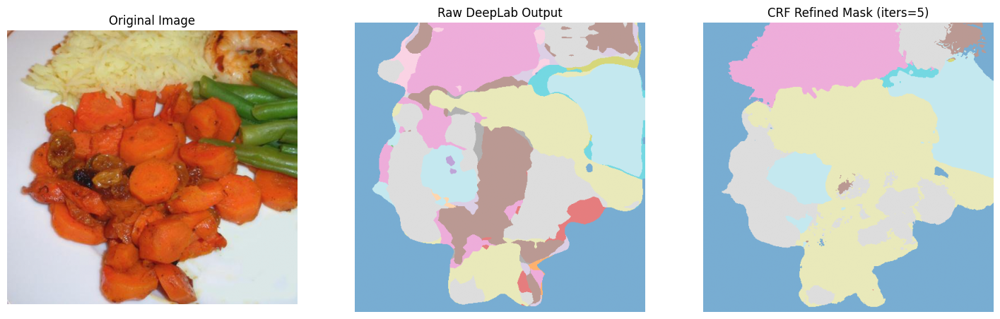

True food items:       ['French beans', 'rice', 'dried cranberries', 'carrot', 'shrimp']
Predicted food items:  ['French beans', 'cauliflower', 'tomato', 'watermelon', 'okra', 'chicken duck', 'carrot', 'broccoli', 'bread', 'corn', 'strawberry', 'green beans']
Food accuracy (set-based): 13.33%
Pixel Accuracy: 63.51%
Mean IoU:       40.07%
Mean Dice:      44.30%
Avg. Hausdorff: 94.46 pixels



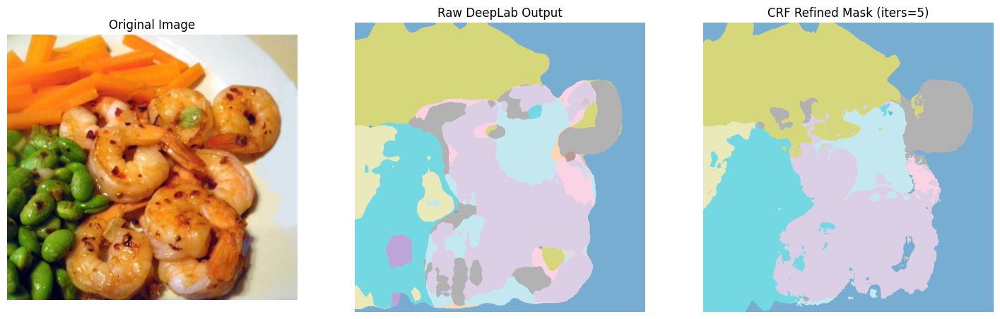

True food items:       ['shrimp', 'carrot', 'green beans']
Predicted food items:  ['white button mushroom', 'potato', 'cauliflower', 'tomato', 'chicken duck', 'carrot', 'broccoli', 'green beans']
Food accuracy (set-based): 22.22%
Pixel Accuracy: 50.51%
Mean IoU:       55.31%
Mean Dice:      63.66%
Avg. Hausdorff: 258.04 pixels



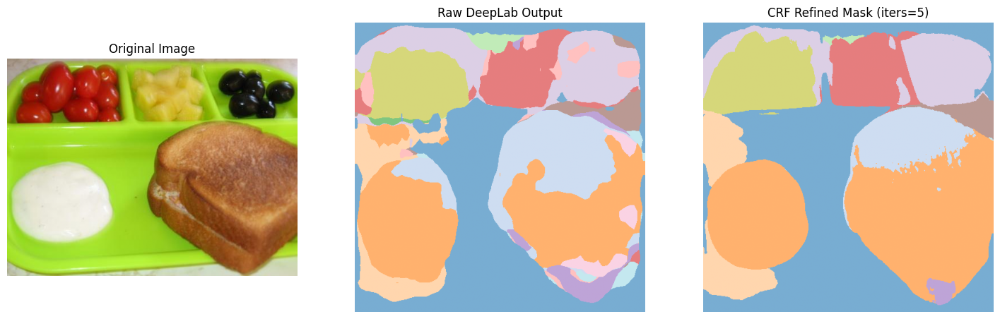

True food items:       ['olives', 'pineapple', 'tomato', 'sauce', 'bread']
Predicted food items:  ['peach', 'pudding', 'ice cream', 'grape', 'cake', 'tomato', 'milkshake', 'orange', 'milk', 'tea', 'bamboo shoots', 'peanut', 'strawberry']
Food accuracy (set-based): 5.88%
Pixel Accuracy: 37.19%
Mean IoU:       24.42%
Mean Dice:      28.14%
Avg. Hausdorff: 24.19 pixels



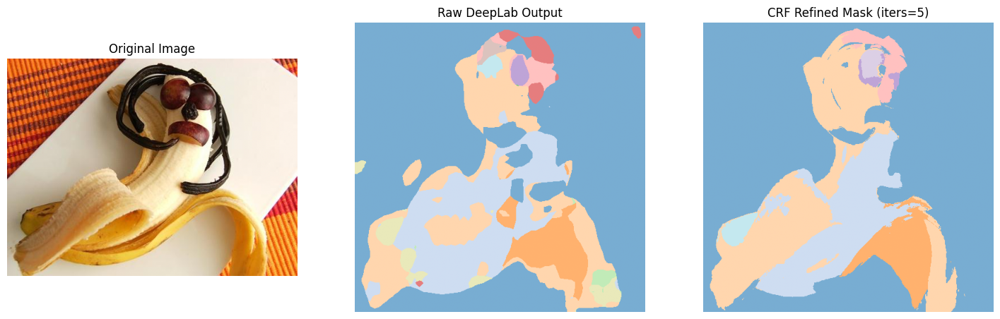

True food items:       ['grape', 'chocolate', 'banana']
Predicted food items:  ['blueberry', 'olives', 'chocolate', 'biscuit', 'ice cream', 'grape', 'milkshake', 'milk', 'almond', 'bamboo shoots']
Food accuracy (set-based): 18.18%
Pixel Accuracy: 55.89%
Mean IoU:       28.70%
Mean Dice:      36.24%
Avg. Hausdorff: 105.50 pixels



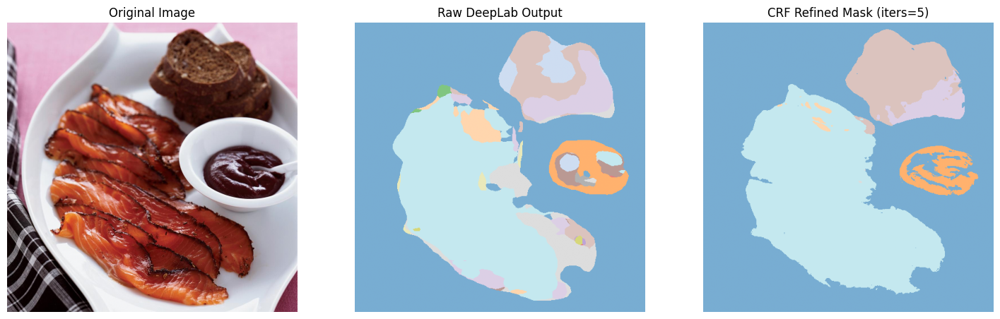

True food items:       ['bread', 'sauce', 'fish']
Predicted food items:  ['white button mushroom', 'coffee', 'steak', 'okra', 'almond', 'bread']
Food accuracy (set-based): 12.50%
Pixel Accuracy: 60.72%
Mean IoU:       40.27%
Mean Dice:      44.46%
Avg. Hausdorff: 47.43 pixels



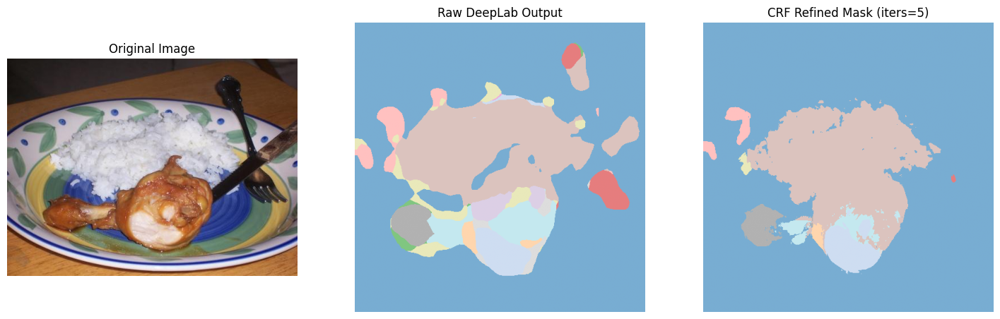

True food items:       ['chicken duck', 'rice']
Predicted food items:  ['king oyster mushroom', 'olives', 'enoki mushroom', 'lemon', 'white button mushroom', 'ice cream', 'tomato', 'ginger', 'cashew', 'bamboo shoots', 'bread', 'hamburg']
Food accuracy (set-based): 0.00%
Pixel Accuracy: 69.76%
Mean IoU:       30.25%
Mean Dice:      31.72%
Avg. Hausdorff: nan pixels



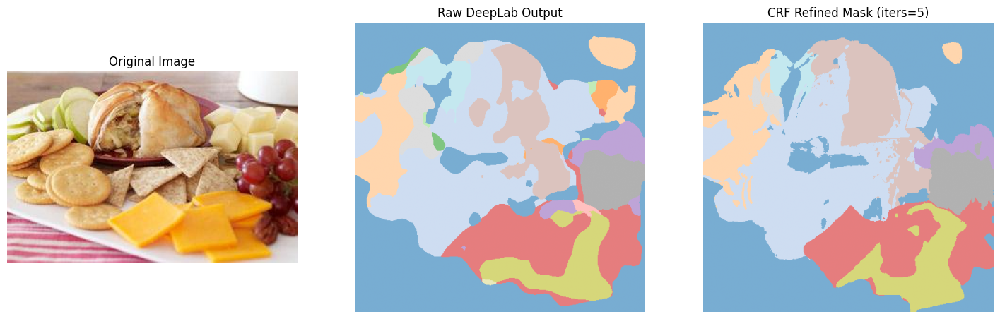

True food items:       ['biscuit', 'other ingredients', 'cheese butter', 'grape', 'apple', 'bread']
Predicted food items:  ['mango', 'enoki mushroom', 'biscuit', 'ice cream', 'grape', 'tomato', 'orange', 'ginger', 'milk', 'almond', 'carrot', 'bread', 'strawberry']
Food accuracy (set-based): 18.75%
Pixel Accuracy: 51.35%
Mean IoU:       25.81%
Mean Dice:      33.77%
Avg. Hausdorff: 152.84 pixels



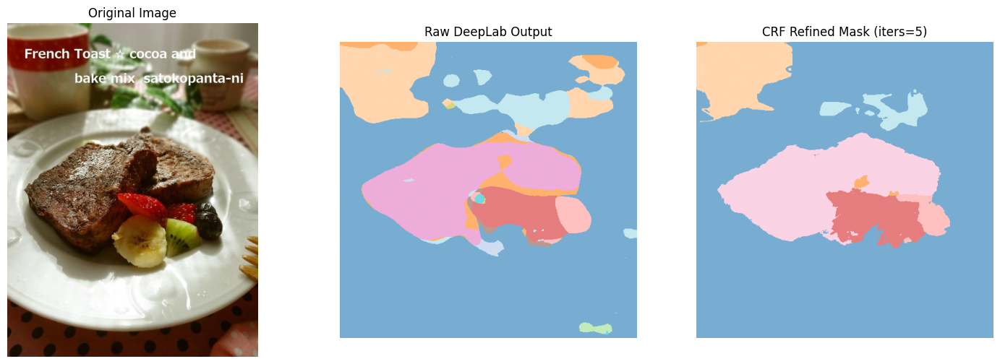

True food items:       ['blueberry', 'kiwi', 'bread', 'banana', 'strawberry']
Predicted food items:  ['raspberry', 'chocolate', 'cake', 'coffee', 'tea', 'cilantro mint', 'bread', 'strawberry']
Food accuracy (set-based): 18.18%
Pixel Accuracy: 85.00%
Mean IoU:       35.49%
Mean Dice:      40.34%
Avg. Hausdorff: 54.58 pixels



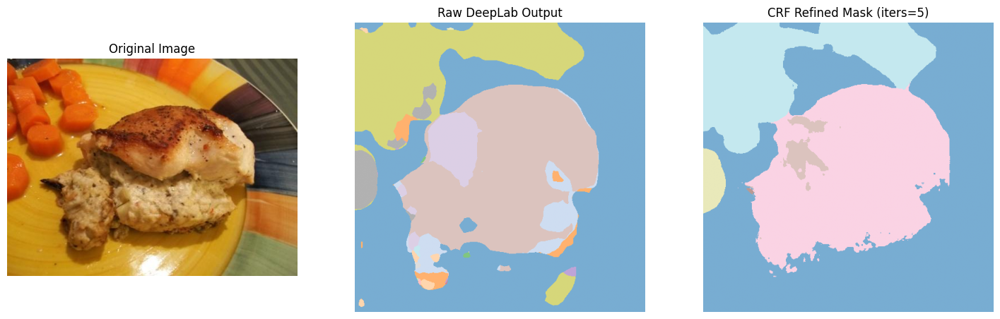

True food items:       ['chicken duck', 'carrot']
Predicted food items:  ['tomato', 'steak', 'chicken duck', 'carrot', 'bread']
Food accuracy (set-based): 40.00%
Pixel Accuracy: 58.23%
Mean IoU:       44.85%
Mean Dice:      54.61%
Avg. Hausdorff: 239.43 pixels



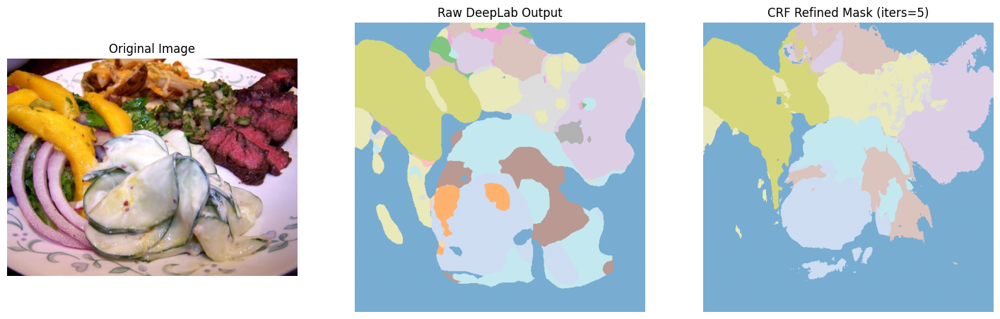

True food items:       ['shiitake', 'other ingredients', 'steak', 'cucumber', 'cilantro mint', 'onion']
Predicted food items:  ['ice cream', 'okra', 'carrot', 'walnut', 'bamboo shoots', 'broccoli', 'cilantro mint', 'celery stick', 'enoki mushroom', 'steak', 'chicken duck', 'shellfish', 'bread', 'hamburg', 'pizza']
Food accuracy (set-based): 10.53%
Pixel Accuracy: 30.79%
Mean IoU:       16.43%
Mean Dice:      21.95%
Avg. Hausdorff: 184.21 pixels



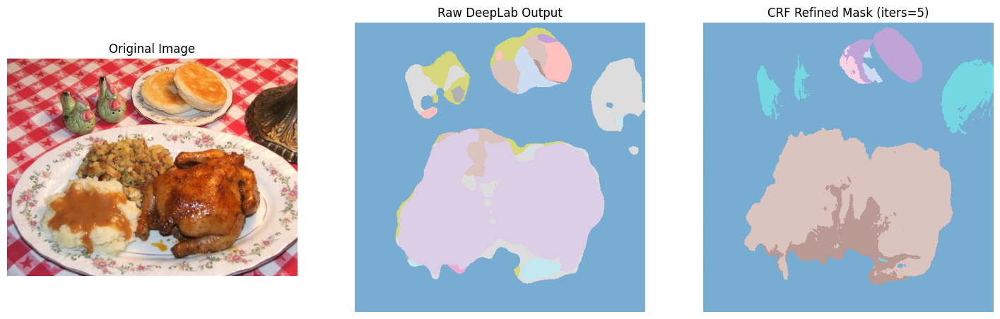

True food items:       ['chicken duck', 'pie', 'potato']
Predicted food items:  ['lemon', 'ice cream', 'steak', 'okra', 'chicken duck', 'bamboo shoots', 'bread']
Food accuracy (set-based): 11.11%
Pixel Accuracy: 76.20%
Mean IoU:       36.79%
Mean Dice:      42.11%
Avg. Hausdorff: 130.03 pixels



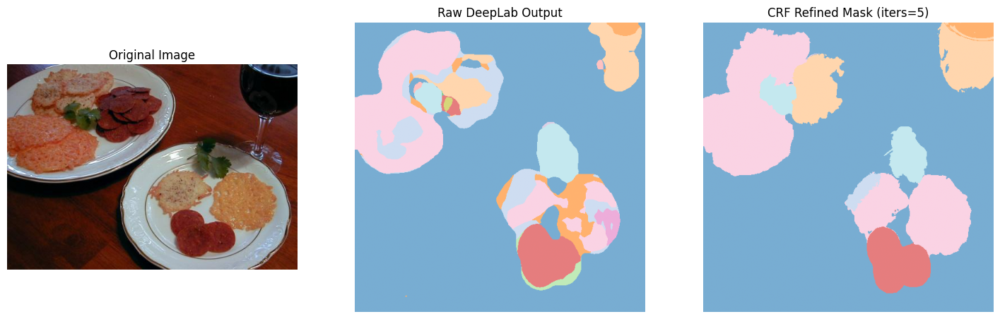

True food items:       ['wine', 'sausage', 'pie', 'cilantro mint']
Predicted food items:  ['ice cream', 'coffee', 'tea', 'almond', 'cilantro mint', 'bread', 'cherry']
Food accuracy (set-based): 10.00%
Pixel Accuracy: 66.47%
Mean IoU:       32.80%
Mean Dice:      35.83%
Avg. Hausdorff: 14.21 pixels



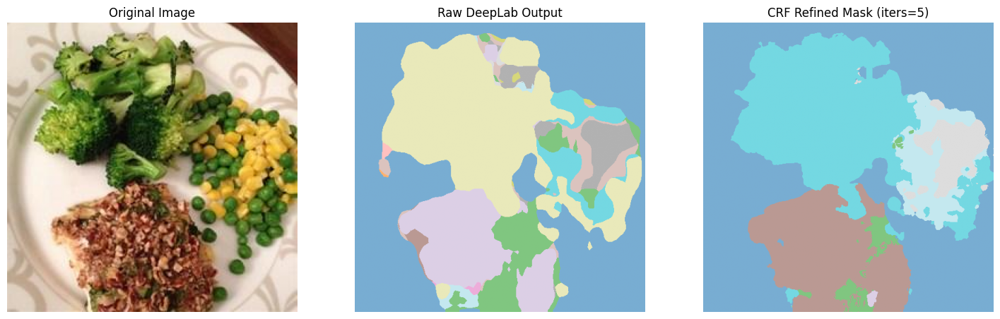

True food items:       ['corn', 'green beans', 'fish', 'broccoli']
Predicted food items:  ['cauliflower', 'steak', 'chicken duck', 'walnut', 'broccoli', 'cilantro mint', 'green beans']
Food accuracy (set-based): 22.22%
Pixel Accuracy: 67.35%
Mean IoU:       41.32%
Mean Dice:      47.38%
Avg. Hausdorff: 145.75 pixels



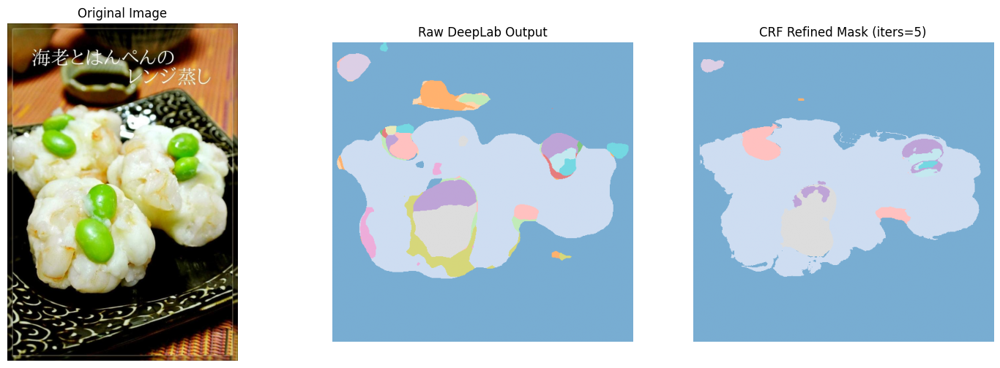

True food items:       ['shrimp', 'green beans']
Predicted food items:  ['olives', 'peach', 'biscuit', 'lemon', 'ice cream', 'grape', 'tomato', 'orange', 'coffee', 'cilantro mint', 'green beans']
Food accuracy (set-based): 8.33%
Pixel Accuracy: 62.27%
Mean IoU:       33.60%
Mean Dice:      37.16%
Avg. Hausdorff: 292.48 pixels



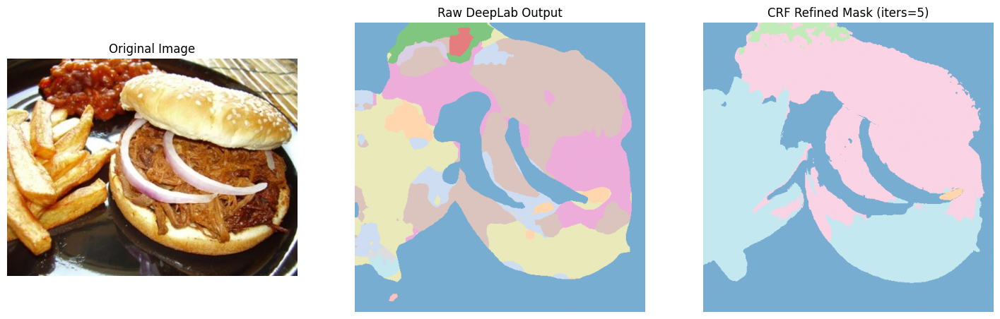

True food items:       ['french fries', 'steak', 'sauce', 'bread', 'onion']
Predicted food items:  ['almond', 'walnut', 'bamboo shoots', 'bread', 'hamburg']
Food accuracy (set-based): 11.11%
Pixel Accuracy: 45.02%
Mean IoU:       21.82%
Mean Dice:      26.09%
Avg. Hausdorff: 167.60 pixels



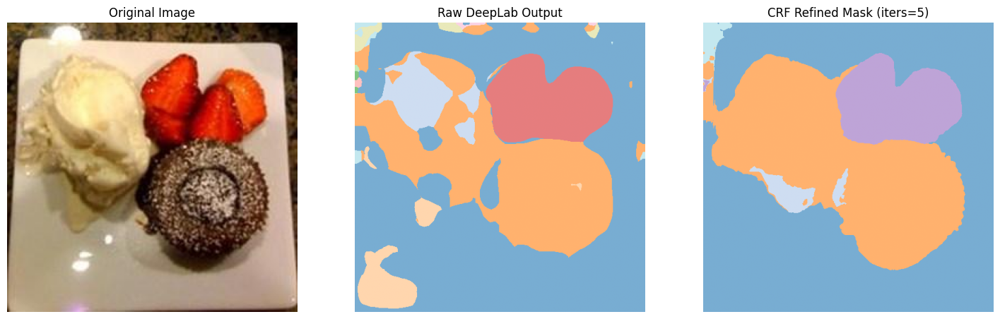

True food items:       ['ice cream', 'cake', 'strawberry']
Predicted food items:  ['blueberry', 'chocolate', 'ice cream', 'cake', 'kelp', 'strawberry']
Food accuracy (set-based): 50.00%
Pixel Accuracy: 81.80%
Mean IoU:       65.09%
Mean Dice:      75.36%
Avg. Hausdorff: 170.59 pixels



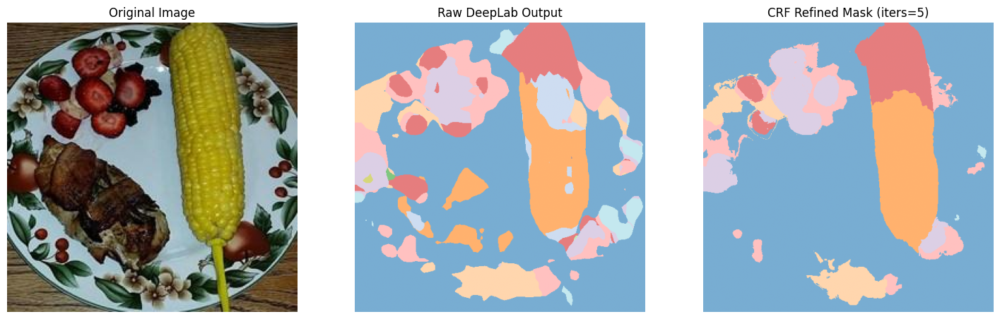

True food items:       ['raspberry', 'pork', 'chicken duck', 'corn', 'banana', 'strawberry']
Predicted food items:  ['blueberry', 'chocolate', 'grape', 'cake', 'almond', 'cilantro mint', 'strawberry', 'cherry']
Food accuracy (set-based): 7.69%
Pixel Accuracy: 53.72%
Mean IoU:       11.85%
Mean Dice:      12.95%
Avg. Hausdorff: 224.84 pixels



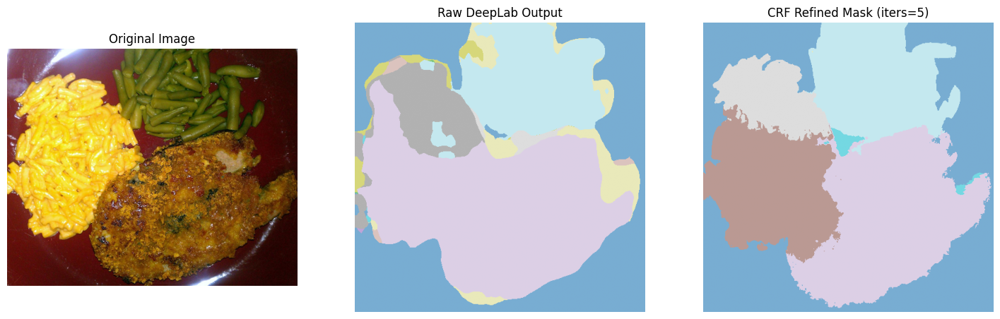

True food items:       ['pasta', 'French beans', 'pork']
Predicted food items:  ['French beans', 'cauliflower', 'steak', 'chicken duck', 'carrot', 'broccoli']
Food accuracy (set-based): 12.50%
Pixel Accuracy: 47.40%
Mean IoU:       46.19%
Mean Dice:      48.02%
Avg. Hausdorff: 37.20 pixels



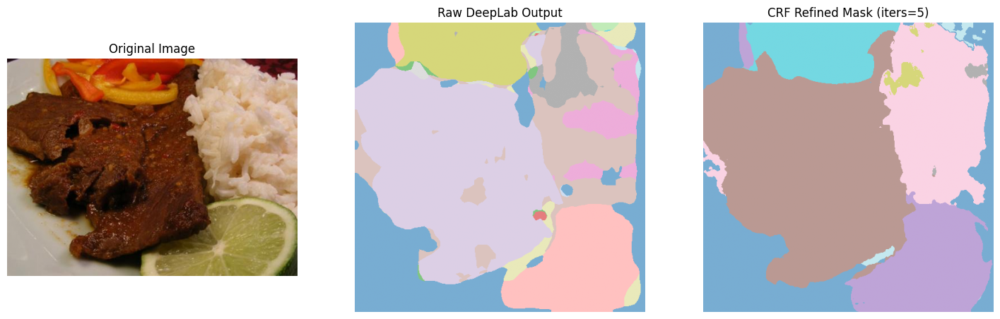

True food items:       ['chicken duck', 'rice', 'lemon', 'pepper']
Predicted food items:  ['rice', 'lemon', 'cauliflower', 'steak', 'chicken duck', 'carrot', 'broccoli', 'cilantro mint', 'bread']
Food accuracy (set-based): 30.00%
Pixel Accuracy: 26.33%
Mean IoU:       29.86%
Mean Dice:      34.75%
Avg. Hausdorff: 356.16 pixels



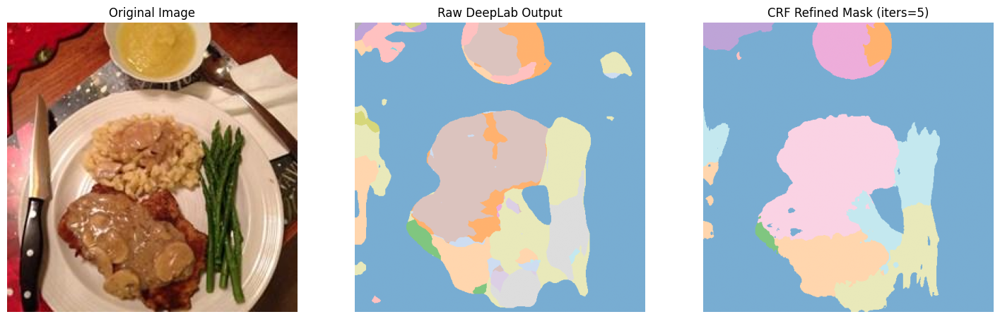

True food items:       ['white button mushroom', 'steak', 'sauce', 'asparagus', 'egg']
Predicted food items:  ['cilantro mint', 'olives', 'lemon', 'coffee', 'okra', 'tea', 'almond', 'walnut', 'bamboo shoots', 'soup', 'bread']
Food accuracy (set-based): 0.00%
Pixel Accuracy: 60.19%
Mean IoU:       15.35%
Mean Dice:      15.98%
Avg. Hausdorff: nan pixels



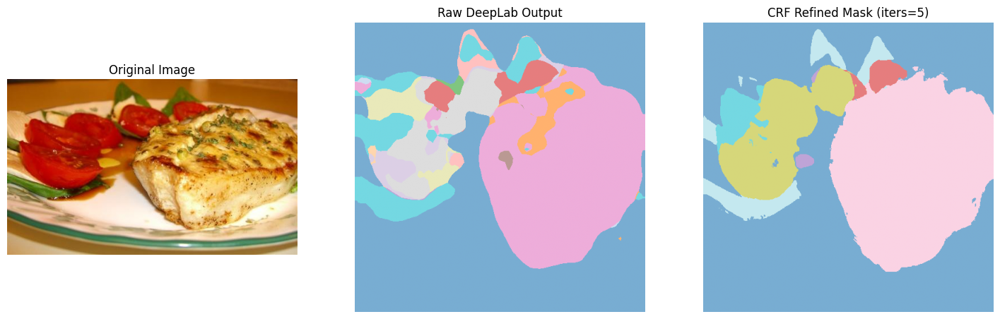

True food items:       ['tomato', 'cheese butter', 'fish', 'cilantro mint']
Predicted food items:  ['lemon', 'tomato', 'carrot', 'bamboo shoots', 'cilantro mint', 'bread', 'strawberry']
Food accuracy (set-based): 22.22%
Pixel Accuracy: 62.23%
Mean IoU:       49.24%
Mean Dice:      53.97%
Avg. Hausdorff: 48.96 pixels



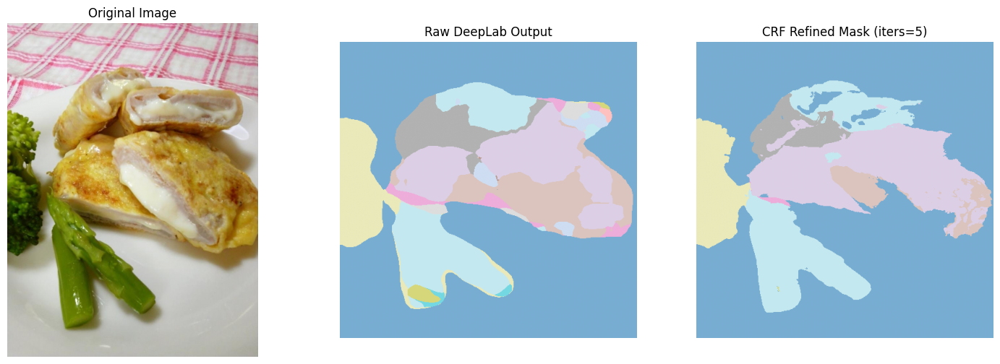

True food items:       ['chicken duck', 'asparagus', 'broccoli']
Predicted food items:  ['French beans', 'enoki mushroom', 'cauliflower', 'chicken duck', 'carrot', 'broccoli', 'bread', 'hamburg']
Food accuracy (set-based): 22.22%
Pixel Accuracy: 72.72%
Mean IoU:       54.85%
Mean Dice:      61.92%
Avg. Hausdorff: 43.81 pixels



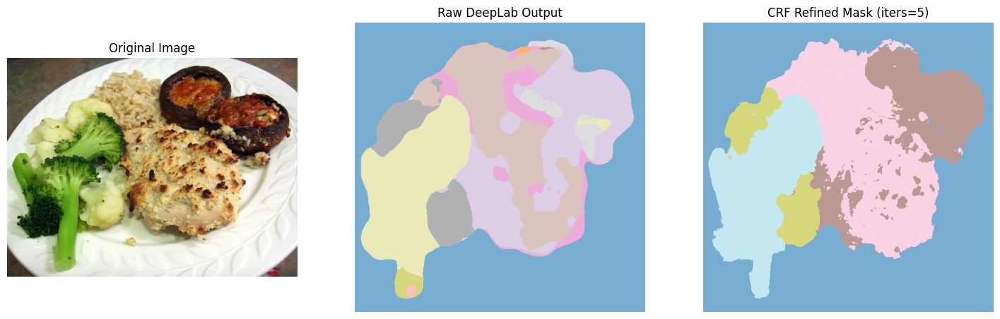

True food items:       ['rice', 'shiitake', 'cauliflower', 'chicken duck', 'broccoli']
Predicted food items:  ['cauliflower', 'seaweed', 'steak', 'okra', 'chicken duck', 'carrot', 'broccoli', 'celery stick', 'bread', 'hamburg']
Food accuracy (set-based): 25.00%
Pixel Accuracy: 65.90%
Mean IoU:       43.34%
Mean Dice:      49.11%
Avg. Hausdorff: 70.71 pixels



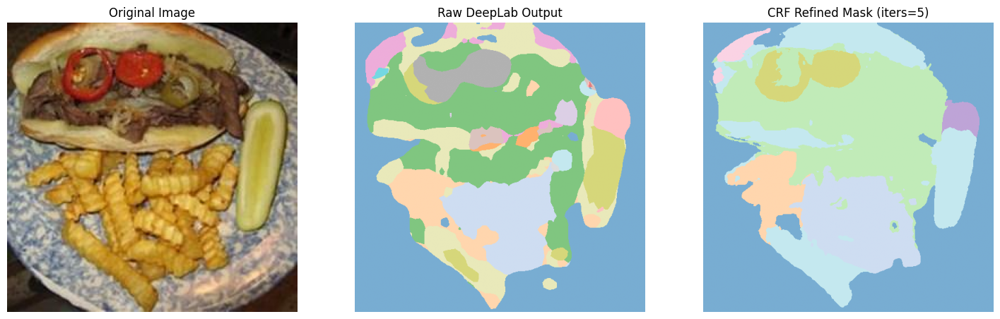

True food items:       ['french fries', 'tomato', 'steak', 'cucumber', 'bread', 'onion', 'pepper']
Predicted food items:  ['lemon', 'biscuit', 'tomato', 'almond', 'carrot', 'walnut', 'bamboo shoots', 'hamburg']
Food accuracy (set-based): 7.14%
Pixel Accuracy: 37.06%
Mean IoU:       16.28%
Mean Dice:      19.27%
Avg. Hausdorff: 101.71 pixels



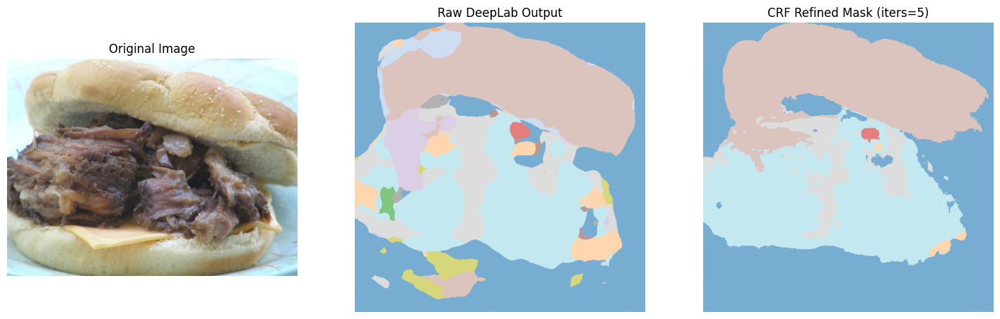

True food items:       ['cheese butter', 'bread', 'pork']
Predicted food items:  ['blueberry', 'enoki mushroom', 'biscuit', 'white button mushroom', 'seaweed', 'steak', 'okra', 'almond', 'bread']
Food accuracy (set-based): 9.09%
Pixel Accuracy: 38.68%
Mean IoU:       22.63%
Mean Dice:      31.10%
Avg. Hausdorff: 315.07 pixels


Overall Segmentation Performance Metrics:
Avg. Pixel Accuracy:  55.53%
Avg. Mean IoU:        34.87%
Avg. Mean Dice:       39.75%
Avg. Hausdorff Dist.: 143.28 pixels

Average per-sample Food Accuracy (Jaccard): 16.94%

Classification Report (Presence/Absence for each food label):
                       precision    recall  f1-score   support

                candy       0.00      0.00      0.00        11
             egg tart       0.00      0.00      0.00         1
         french fries       0.00      0.00      0.00        78
            chocolate       0.05      0.78      0.09        18
              biscuit       0.09      0.57      0.15        77
           

In [8]:
import numpy as np
import pandas as pd
import io
import matplotlib.pyplot as plt
from PIL import Image
import torch
from torchvision import transforms
from matplotlib.colors import ListedColormap
import torch.nn as nn
from pyarrow.parquet import ParquetFile
from scipy.spatial.distance import directed_hausdorff
import cv2
import pydensecrf.densecrf as dcrf
from pydensecrf.utils import unary_from_softmax, create_pairwise_gaussian, create_pairwise_bilateral
import concurrent.futures
from tqdm import tqdm

# NEW: import classification_report from sklearn
from sklearn.metrics import classification_report

############################################
# Hyperparameters and Settings
############################################
BASE_SIZE = 513
IMG_SCALE = 1.0
IMG_SIZE = (int(round(BASE_SIZE * IMG_SCALE)), int(round(BASE_SIZE * IMG_SCALE)))
HYPERPARAMS = {
    "img_size": IMG_SIZE,
    "num_classes": 104,  # Total classes (e.g., 0-103, with 0 as background)
    "dropout_rate": 0.5,
    "crf_iters": 5   # CRF iterations
}

# Load class mappings CSV.
class_mappings = pd.read_csv('/content/foodseg103/class_mappings.csv')
id_to_food = dict(zip(class_mappings["Class Id"], class_mappings["Class Name"]))

############################################
# Model Loading Function
############################################
def load_model():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)
    # Modify classifier: insert dropout and update final conv layer.
    if isinstance(model.classifier, nn.Sequential):
        classifier_layers = list(model.classifier.children())
        classifier_layers.insert(-1, nn.Dropout(HYPERPARAMS["dropout_rate"]))
        classifier_layers[-1] = nn.Conv2d(256, HYPERPARAMS["num_classes"], kernel_size=1)
        model.classifier = nn.Sequential(*classifier_layers)
    else:
        model.classifier[4] = nn.Conv2d(256, HYPERPARAMS["num_classes"], kernel_size=1)

    checkpoint = torch.load("/content/foodseg103/best_deeplabv3_resnet50_foodseg103_checkpoint.pth", map_location=device)
    model.load_state_dict(checkpoint["model_state_dict"], strict=False)
    model.to(device)
    model.eval()
    return model, device

############################################
# Image Transform
############################################
img_transform = transforms.Compose([
    transforms.Resize(HYPERPARAMS["img_size"]),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

############################################
# Streaming Validation Batches Function
############################################
def stream_validation_batches(parquet_path, batch_size=16):
    """
    Streams validation data in mini-batches without loading the entire dataset.
    For each row, we precompute a NumPy version of the resized image (for CRF)
    so that we avoid doing the resize conversion repeatedly.
    """
    pf = ParquetFile(parquet_path)
    batch_iter = pf.iter_batches(batch_size=1)  # one row per file batch
    batch_images = []
    batch_img_tensors = []
    batch_gt_masks = []
    batch_np_images = []  # Pre-resized NumPy images for CRF refinement

    for batch in batch_iter:
        row = batch.to_pydict()
        img_bytes = row["image"][0]["bytes"]
        label_bytes = row["label"][0]["bytes"]
        img = Image.open(io.BytesIO(img_bytes)).convert("RGB")
        gt_mask = np.array(Image.open(io.BytesIO(label_bytes)).resize(HYPERPARAMS["img_size"], Image.NEAREST))
        img_tensor = img_transform(img)
        img_np = np.array(img.resize(HYPERPARAMS["img_size"], Image.BILINEAR))
        if img_np.ndim == 2:
            img_np = np.stack([img_np]*3, axis=-1)

        batch_images.append(img)
        batch_img_tensors.append(img_tensor)
        batch_gt_masks.append(gt_mask)
        batch_np_images.append(img_np)

        if len(batch_images) == batch_size:
            yield batch_images, torch.stack(batch_img_tensors), np.array(batch_gt_masks), batch_np_images
            batch_images = []
            batch_img_tensors = []
            batch_gt_masks = []
            batch_np_images = []

    if batch_images:
        yield batch_images, torch.stack(batch_img_tensors), np.array(batch_gt_masks), batch_np_images

############################################
# Metrics and Distance Functions
############################################
def compute_segmentation_metrics(pred, target, num_classes, ignore_bg=True):
    pred, target = pred.flatten(), target.flatten()
    pixel_acc = np.mean(pred == target)
    classes_to_eval = set(np.unique(target))
    if ignore_bg:
        classes_to_eval.discard(0)
    classes_to_eval = sorted(classes_to_eval)
    if not classes_to_eval:
        return pixel_acc, 1.0, 1.0
    # Initialize lists for IOU and Dice scores
    iou_list, dice_list = [], []
    for cls in classes_to_eval:
        pred_inds, target_inds = (pred == cls), (target == cls)
        intersection = np.sum(pred_inds & target_inds)
        union = np.sum(pred_inds | target_inds)
        iou = intersection / union if union != 0 else 1.0
        dice = (2 * intersection) / (np.sum(pred_inds) + np.sum(target_inds) + 1e-8)
        iou_list.append(iou)
        dice_list.append(dice)
    return pixel_acc, np.mean(iou_list), np.mean(dice_list)

def hausdorff_distance_for_class(pred, target, cls):
    pred_points, target_points = np.argwhere(pred == cls), np.argwhere(target == cls)
    if pred_points.size == 0 or target_points.size == 0:
        return np.nan
    return max(directed_hausdorff(pred_points, target_points)[0],
               directed_hausdorff(target_points, pred_points)[0])

def compute_average_hausdorff(pred, target, num_classes):
    hd_list = [hausdorff_distance_for_class(pred, target, cls) for cls in range(1, num_classes)]
    valid_hd = [hd for hd in hd_list if not np.isnan(hd)]
    return np.nanmean(valid_hd) if valid_hd else np.nan

############################################
# CRF Refinement Function
############################################
def crf_refine(image, probs, num_iters=10):
    H, W = image.shape[:2]
    C = probs.shape[0]
    unary = unary_from_softmax(probs)
    unary = np.ascontiguousarray(unary)
    d = dcrf.DenseCRF2D(W, H, C)
    d.setUnaryEnergy(unary)
    feats_gaussian = create_pairwise_gaussian(sdims=(3, 3), shape=(H, W))
    d.addPairwiseEnergy(feats_gaussian, compat=6)
    feats_bilateral = create_pairwise_bilateral(sdims=(50, 50), schan=(13, 13, 13),
                                                img=image, chdim=2)
    d.addPairwiseEnergy(feats_bilateral, compat=15)
    Q = d.inference(num_iters)
    crf_result = np.argmax(Q, axis=0).reshape((H, W))
    return crf_result

############################################
# Main Function
############################################
def main():
    model, device = load_model()
    parquet_path = "/content/foodseg103/validation-00000-of-00001-a5bfdaa5beb7006a.parquet"
    batch_size = 16

    # Get total rows from parquet metadata.
    pf = ParquetFile(parquet_path)
    total_rows = pf.metadata.num_rows
    total_batches = total_rows // batch_size + (1 if total_rows % batch_size != 0 else 0)

    cmap = ListedColormap(plt.cm.tab20.colors[:HYPERPARAMS["num_classes"]])
    overall_metrics = {"pixel_acc": [], "mean_iou": [], "mean_dice": [], "hausdorff": []}

    # For multi-label classification_report
    all_gt_vectors = []
    all_pred_vectors = []

    # Track per-sample “food accuracy” (set-based).
    food_accuracy_list = []

    visualizations = []  # for up to 25 samples

    progress = tqdm(stream_validation_batches(parquet_path, batch_size=batch_size),
                    total=total_batches,
                    desc="Processing Batches")

    # Use ProcessPoolExecutor for CRF processing
    with concurrent.futures.ProcessPoolExecutor() as executor:
        for batch_images, img_tensors, gt_masks, batch_np_images in progress:
            img_tensors = img_tensors.to(device)
            with torch.no_grad():
                outputs = model(img_tensors)['out']
                raw_masks = outputs.argmax(dim=1).cpu().numpy()
                probs = torch.softmax(outputs, dim=1).cpu().numpy()

            current_batch = len(batch_images)
            crf_masks = [None] * current_batch

            # Submit CRF jobs in parallel
            futures = {
                executor.submit(crf_refine, batch_np_images[i], probs[i],
                                num_iters=HYPERPARAMS["crf_iters"]): i
                for i in range(current_batch)
            }
            for future in concurrent.futures.as_completed(futures):
                i = futures[future]
                crf_masks[i] = future.result()

            for i in range(current_batch):
                raw_mask = raw_masks[i]
                refined_mask = crf_masks[i]
                gt_mask = gt_masks[i]

                # Compute segmentation metrics
                pix_acc, mean_iou, mean_dice = compute_segmentation_metrics(
                    refined_mask, gt_mask, HYPERPARAMS["num_classes"], ignore_bg=False
                )
                avg_hausdorff = compute_average_hausdorff(
                    refined_mask, gt_mask, HYPERPARAMS["num_classes"]
                )

                overall_metrics["pixel_acc"].append(pix_acc)
                overall_metrics["mean_iou"].append(mean_iou)
                overall_metrics["mean_dice"].append(mean_dice)
                overall_metrics["hausdorff"].append(avg_hausdorff)

                # Get sets of true vs. predicted labels (excluding background=0)
                true_ids = set(np.unique(gt_mask)) - {0}
                pred_ids = set(np.unique(refined_mask)) - {0}

                # 1) Per-sample food accuracy = Jaccard index of sets
                #    (|true ∩ pred| / |true ∪ pred|). If both sets are empty => 1.0
                if len(true_ids) == 0 and len(pred_ids) == 0:
                    sample_food_accuracy = 1.0
                else:
                    intersection = len(true_ids & pred_ids)
                    union = len(true_ids | pred_ids)
                    sample_food_accuracy = intersection / union if union > 0 else 0.0
                food_accuracy_list.append(sample_food_accuracy)

                # 2) For classification_report (multi-label):
                #    Build binary vectors for ground truth and predictions.
                #    We'll do it for labels 1..(num_classes-1).
                gt_vec = np.zeros(HYPERPARAMS["num_classes"] - 1, dtype=int)
                pred_vec = np.zeros(HYPERPARAMS["num_classes"] - 1, dtype=int)
                for lbl in true_ids:
                    if 1 <= lbl < HYPERPARAMS["num_classes"]:
                        gt_vec[lbl - 1] = 1
                for lbl in pred_ids:
                    if 1 <= lbl < HYPERPARAMS["num_classes"]:
                        pred_vec[lbl - 1] = 1
                all_gt_vectors.append(gt_vec)
                all_pred_vectors.append(pred_vec)

                # Collect up to 25 visualizations
                if len(visualizations) < 25:
                    vis_info = {
                        "original": batch_images[i],
                        "raw_mask": raw_mask,
                        "refined_mask": refined_mask,
                        "true_ids": [id_to_food.get(fid, f"ID {fid}") for fid in true_ids],
                        "pred_ids": [id_to_food.get(fid, f"ID {fid}") for fid in pred_ids],
                        "pix_acc": pix_acc,
                        "mean_iou": mean_iou,
                        "mean_dice": mean_dice,
                        "hausdorff": avg_hausdorff,
                        "food_accuracy": sample_food_accuracy
                    }
                    visualizations.append(vis_info)

    # Visualization for first 25 samples
    for vis in visualizations:
        img_np = np.array(vis["original"]) / 255.0
        fig, ax = plt.subplots(1, 3, figsize=(18, 6))
        ax[0].imshow(img_np)
        ax[0].set_title("Original Image")
        ax[1].imshow(vis["raw_mask"], cmap=cmap, alpha=0.6)
        ax[1].set_title("Raw DeepLab Output")
        ax[2].imshow(vis["refined_mask"], cmap=cmap, alpha=0.6)
        ax[2].set_title(f"CRF Refined Mask (iters={HYPERPARAMS['crf_iters']})")
        for a in ax:
            a.axis("off")
        plt.show()

        print("True food items:      ", vis["true_ids"])
        print("Predicted food items: ", vis["pred_ids"])
        print(f"Food accuracy (set-based): {vis['food_accuracy']*100:.2f}%")
        print(f"Pixel Accuracy: {vis['pix_acc']*100:.2f}%")
        print(f"Mean IoU:       {vis['mean_iou']*100:.2f}%")
        print(f"Mean Dice:      {vis['mean_dice']*100:.2f}%")
        print(f"Avg. Hausdorff: {vis['hausdorff']:.2f} pixels\n")

    # Overall segmentation metrics
    final_pixel_acc = np.mean(overall_metrics['pixel_acc']) * 100
    final_mean_iou = np.mean(overall_metrics['mean_iou']) * 100
    final_mean_dice = np.mean(overall_metrics['mean_dice']) * 100
    final_hausdorff = np.nanmean(overall_metrics['hausdorff'])

    print("\nOverall Segmentation Performance Metrics:")
    print(f"Avg. Pixel Accuracy:  {final_pixel_acc:.2f}%")
    print(f"Avg. Mean IoU:        {final_mean_iou:.2f}%")
    print(f"Avg. Mean Dice:       {final_mean_dice:.2f}%")
    print(f"Avg. Hausdorff Dist.: {final_hausdorff:.2f} pixels")

    # Print average food accuracy across samples
    mean_food_accuracy = np.mean(food_accuracy_list) * 100
    print(f"\nAverage per-sample Food Accuracy (Jaccard): {mean_food_accuracy:.2f}%")

    # Produce a multi-label classification report for presence/absence of each food
    # Prepare label names for classes 1..(num_classes-1)
    food_labels = [id_to_food[i] for i in range(1, HYPERPARAMS["num_classes"])]
    print("\nClassification Report (Presence/Absence for each food label):")
    print(classification_report(
        np.array(all_gt_vectors),
        np.array(all_pred_vectors),
        target_names=food_labels,
        zero_division=0
    ))

if __name__ == "__main__":
    main()


## Test on Completly unseen image

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
<ipython-input-15-bf3171775637>:37: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(

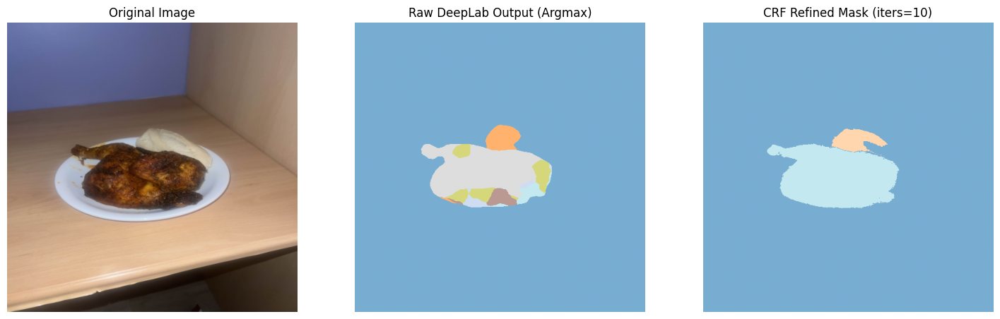

Predicted food labels: ['ice cream', 'steak']


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
from torchvision import transforms
import torch.nn as nn
import cv2
import pydensecrf.densecrf as dcrf
from pydensecrf.utils import create_pairwise_gaussian, create_pairwise_bilateral, softmax_to_unary

# Hyperparameters
BASE_SIZE = 513
IMG_SCALE = 1.0
IMG_SIZE = (int(round(BASE_SIZE * IMG_SCALE)), int(round(BASE_SIZE * IMG_SCALE)))
HYPERPARAMS = {
    "img_size": IMG_SIZE,
    "num_classes": 104,
    "dropout_rate": 0.3,
    "crf_iters": 10
}

# Model Loading
def load_model():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    # Load the pretrained DeepLabV3 model
    model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)
    if isinstance(model.classifier, nn.Sequential):
        classifier_layers = list(model.classifier.children())
        # Insert dropout exactly as in training:
        classifier_layers.insert(-1, nn.Dropout(HYPERPARAMS["dropout_rate"]))
        classifier_layers[-1] = nn.Conv2d(256, HYPERPARAMS["num_classes"], kernel_size=1)
        model.classifier = nn.Sequential(*classifier_layers)
    else:
        model.classifier[4] = nn.Conv2d(256, HYPERPARAMS["num_classes"], kernel_size=1)

    # Load only the model_state_dict from checkpoint
    checkpoint = torch.load("/content/foodseg103/best_deeplabv3_resnet50_foodseg103_checkpoint.pth",
                              map_location=device)
    model.load_state_dict(checkpoint["model_state_dict"], strict=False)
    model.to(device)
    model.eval()
    return model, device


# Image Transform
img_transform = transforms.Compose([
    transforms.Resize(HYPERPARAMS["img_size"]),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])


# CRF Refinement Function
def crf_refine(image, probs, num_iters=10):
    H, W = image.shape[:2]
    C = probs.shape[0]
    unary = softmax_to_unary(probs)  # shape [C, H*W]
    unary = np.ascontiguousarray(unary)
    d = dcrf.DenseCRF2D(W, H, C)
    d.setUnaryEnergy(unary)
    feats_gaussian = create_pairwise_gaussian(sdims=(3,3), shape=(H, W))
    d.addPairwiseEnergy(feats_gaussian, compat=6)
    feats_bilateral = create_pairwise_bilateral(sdims=(50,50), schan=(13,13,13),
                                                img=image, chdim=2)
    d.addPairwiseEnergy(feats_bilateral, compat=15)
    Q = d.inference(num_iters)
    crf_result = np.argmax(Q, axis=0).reshape((H, W))
    return crf_result


# Process image
def process_unlabeled_image(image_path, model, device):
    # Load image using PIL.
    img = Image.open(image_path).convert("RGB")

    # Transform image.
    input_tensor = img_transform(img).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(input_tensor)['out'][0]  # shape: [C, H, W]
        raw_pred_mask = outputs.argmax(0).cpu().numpy()
        probs = torch.softmax(outputs, dim=0).cpu().numpy()  # shape: [C, H, W]

    # Prepare image for CRF
    img_np = np.array(img.resize(HYPERPARAMS["img_size"], Image.BILINEAR))
    if img_np.ndim == 2:
        img_np = np.stack([img_np]*3, axis=-1)

    # Run CRF refinement.
    crf_mask = crf_refine(img_np, probs, num_iters=HYPERPARAMS["crf_iters"])

    return img, raw_pred_mask, crf_mask, input_tensor


# Main Function
def main():
    image_path = "/content/SegTest.jpg"
    model, device = load_model()

    # Process the image.
    img, raw_mask, refined_mask, input_tensor = process_unlabeled_image(image_path, model, device)

    # Denormalize the image for display.
    img_denorm = input_tensor.squeeze(0) * torch.tensor([0.229, 0.224, 0.225], device=device).view(3,1,1) \
               + torch.tensor([0.485, 0.456, 0.406], device=device).view(3,1,1)
    img_np = np.clip(img_denorm.permute(1,2,0).cpu().numpy(), 0, 1)

   # Gets predicated food labels
    unique_labels = np.unique(refined_mask)
    unique_labels = unique_labels[unique_labels != 0]
    predicted_foods = [id_to_food.get(int(label), f"ID {label}") for label in unique_labels]

     # Display the Original Image, Raw Predicted Mask, and CRF Refined Mask.
    cmap = ListedColormap(plt.cm.tab20.colors[:HYPERPARAMS["num_classes"]])
    fig, ax = plt.subplots(1, 3, figsize=(18, 6))
    ax[0].imshow(img_np)
    ax[0].set_title("Original Image")
    ax[1].imshow(raw_mask, cmap=cmap, alpha=0.6)
    ax[1].set_title("Raw DeepLab Output (Argmax)")
    ax[2].imshow(refined_mask, cmap=cmap, alpha=0.6)
    ax[2].set_title(f"CRF Refined Mask (iters={HYPERPARAMS['crf_iters']})")
    for a in ax:
        a.axis("off")
    plt.show()

    print("Predicted food labels:", predicted_foods)

if __name__ == "__main__":
    main()
